<a href="https://colab.research.google.com/github/jocelynbaduria/cmpe-257_Machine_Learning/blob/main/Team_Underdog_Fake_or_Real.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Team Objective Function : 

Identify if the Article is Real or Fake based on Source Reputation, Reliable Source, ClickBait Factors.

Factor: 
**Source Reputation**

  What is the reputation of the source of the article or corpus?

Microfactors:

1. Persona ( **Person** or **Organization** ) 
- **Source Ratings Score** -> 1(True), 2(mostly-true) 3(half-true), 4(barely-true), 5(pants-fire), 6(false) 
2. **Reputation Score** -> ( Source Rating Score > 3 and more than 999 counts - Source is not reputable)
3. Wrting Style
 
   **Sentence Similarity**, Text Average
   Sentence Similarity : Naive Bayes Classifier
   Score : Accuracy, F1, Recall, Precision

   Text Average :  KMeans 
   Score : Tf-idf Score

### Install necessary Libraries to run the notebook. Mounting drive is done automatically once login to your google drive.

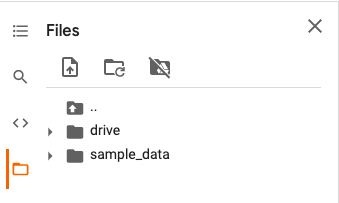

In [ ]:
!pip install requests beautifulsoup4 
!pip install sidetable
!pip install sidetable -U
!pip install pandas -U  
!pip install nltk
!pip install gensim
!pip install textract

Requirement already up-to-date: sidetable in /usr/local/lib/python3.7/dist-packages (0.8.0)
     |████████████████████████████████| 9.9MB 5.3MB/s 
ERROR: google-colab 1.0.0 has requirement pandas~=1.1.0; python_version >= "3.0", but you'll have pandas 1.2.4 which is incompatible.
  Found existing installation: pandas 1.1.5
    Uninstalling pandas-1.1.5:
      Successfully uninstalled pandas-1.1.5


     |████████████████████████████████| 102kB 4.0MB/s 
     |████████████████████████████████| 51kB 4.5MB/s 
     |████████████████████████████████| 8.9MB 6.5MB/s 
     |████████████████████████████████| 5.6MB 19.0MB/s 
     |████████████████████████████████| 112kB 43.9MB/s 
     |████████████████████████████████| 32.8MB 122kB/s 
     |████████████████████████████████| 112kB 56.6MB/s 
     |████████████████████████████████| 112kB 45.4MB/s 
     |████████████████████████████████| 81kB 7.9MB/s 
     |████████████████████████████████| 153kB 50.1MB/s 
     |████████████████████████████████| 1.9MB 50.6MB/s 
  Created wheel for python-pptx: filename=python_pptx-0.6.18-cp37-none-any.whl size=275704 sha256=e156bce52db72d925c786ecfcf4ca192c0f48392b4d97dbfbd3dfb1cbd4945a7
  Stored in directory: /root/.cache/pip/wheels/1f/1f/2c/29acca422b420a0b5210bd2cd7e9669804520d602d2462f20b
  Created wheel for docx2txt: filename=docx2txt-0.8-cp37-none-any.whl size=3963 sha256=f32beaf9c7b6d3111f59c10a3c4f449b0

In [ ]:
from bs4 import BeautifulSoup 
import pandas as pd
import requests
import urllib.request
import time
import re
import sidetable
import gensim
from textract import process

import nltk
nltk.download('stopwords')
%matplotlib inline

from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
import pickle

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ray\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# First Factor Model - Source Reputation

Data Narrative :

First Microfactor (Rating Score) - Best Classifier MLP with accuracy of 100%.

Second Microfactor (Reputation Score) - Best Classifier Decision Trees with accuracy of 100%.

Third Microfactor (Sentence Similarity) - Naive Bayes Multinomial accuracy of 100%

### Load Saved Data

In [ ]:
# Politifact
import pandas as pd
path = '/content/drive/MyDrive/Underdog/NLP Project/Sprint4/Jocelyn Baduria/created_file/csv_file/politifact_clean1000.csv'
data_politifact = pd.read_csv(path, parse_dates=True)

In [ ]:
data_politifact

,author,date,statement,source,date_published,target
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",false
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",false
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",pants-fire
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",pants-fire
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",false
...,...,...,...,...,...,...
29965,Paul Specht,"April 15, 2021",On whether he supports the filibuster.,Jeff Jackson,"April 8, 2021",no-flip
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",mostly-true
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",half-true
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",true


Source Rating Score

In [ ]:
# Create a function to get a binary number from the target
# Fact-Check Ratings 1(True), 2(mostly-true) 3(half-true), 4(barely-true), 5(pants-fire), 6(false)
def getScore(text):
  if text == 'true':
    return 1
  if text == 'mostly-true':
    return 2
  if text == 'half-true':
    return 3
  if text == 'barely-true':
    return 4
  if text == 'pants-fire':
    return 5
  if text == 'false':
    return 6
  else:
    return 0

In [ ]:
#Store the data in the dataframe
data_politifact['ratingScore'] = data_politifact['target'].apply(getScore)

In [ ]:
data_politifact

,author,date,statement,source,date_published,target,ratingScore
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",false,6
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",false,6
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",pants-fire,5
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",pants-fire,5
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",false,6
...,...,...,...,...,...,...,...
29965,Paul Specht,"April 15, 2021",On whether he supports the filibuster.,Jeff Jackson,"April 8, 2021",no-flip,0
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",mostly-true,2
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",half-true,3
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",true,1


In [ ]:
# Save the cleaned csv data with target True and Fake
path = '/content/drive/MyDrive/Underdog/NLP Project/Sprint4/Jocelyn Baduria/created_file/csv_file/political_fact_checker_score.csv'
data_politifact.to_csv(path, index=False)

### Visualization

In [ ]:
import plotly.express as px
fig = px.histogram(data_politifact, x='ratingScore',y='source', color="source",
                   marginal="violin", # or violin, rug
                   hover_data=data_politifact.columns, width=1000, height=600, title="Source vs Rating Score ")
fig.show()

In [ ]:
import plotly.express as px
fig = px.histogram(data_politifact, x='source',y='date', color="date",
                   hover_data=data_politifact.columns, width=1000, height=600, title=" Source Count vs Date Publication Count ")
fig.show()

Politifact Table - Cumulative Count Rating Score

In [ ]:
import sidetable
data_politifact.stb.freq(['ratingScore'])

,ratingScore,count,percent,cumulative_count,cumulative_percent
0,6,13986,46.666667,13986,46.666667
1,5,6993,23.333333,20979,70.000000
2,4,2997,10.000000,23976,80.000000
3,3,1998,6.666667,25974,86.666667
4,2,1998,6.666667,27972,93.333333
5,1,999,3.333333,28971,96.666667
6,0,999,3.333333,29970,100.000000


In [ ]:
import sidetable
data_politifact.stb.freq(['source'])

,source,count,percent,cumulative_count,cumulative_percent
0,Facebook posts,12987,43.333333,12987,43.333333
1,Viral image,2997,10.000000,15984,53.333333
2,Tucker Carlson,999,3.333333,16983,56.666667
3,Terry McAuliffe,999,3.333333,17982,60.000000
4,Shelley Moore Capito,999,3.333333,18981,63.333333
5,Richard Durbin,999,3.333333,19980,66.666667
6,Pete Buttigieg,999,3.333333,20979,70.000000
7,Mark Born,999,3.333333,21978,73.333333
8,Jeff Jackson,999,3.333333,22977,76.666667
9,Janet Bewley,999,3.333333,23976,80.000000


In [ ]:
import sidetable
data_politifact.stb.freq(['statement'])

,statement,count,percent,cumulative_count,cumulative_percent
0,“We have 23% of all the lead pipe leads in Ame...,999,3.333333,999,3.333333
1,“This is all about a certificate of vaccinatio...,999,3.333333,1998,6.666667
2,“There is racism physically built into some of...,999,3.333333,2997,10.000000
3,“Stanford study results” show face masks are i...,999,3.333333,3996,13.333333
4,“Private insurance gives … better coverage” th...,999,3.333333,4995,16.666667
5,"“Maybe (the COVID-19 vaccine) doesn't work, an...",999,3.333333,5994,20.000000
6,“Joe Biden and the Democrats want to remove an...,999,3.333333,6993,23.333333
7,"“I restored felons’ rights - 173,000 - more th...",999,3.333333,7992,26.666667
8,“Foot Locker donated 200 million dollars to BLM.”,999,3.333333,8991,30.000000
9,“Black Lives Matter and antifa set Catholic ch...,999,3.333333,9990,33.333333


In [ ]:
# Unique target 
statement_sorted = data_politifact['target'].unique()
statement_sorted.sort()
print(statement_sorted)

['barely-true' 'false' 'half-true' 'mostly-true' 'no-flip' 'pants-fire'
 'true']


## Source Reputation Base Model Classification



### Train the Politifact dataset First Microfactor - Source Rating Score

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
# Scaling the Dataset
from sklearn.preprocessing import StandardScaler

import sklearn.metrics as metrics
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score

from sklearn.model_selection import train_test_split

from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB

In [ ]:
le = LabelEncoder()
data_politifact['author'] = le.fit_transform(data_politifact['author'])
data_politifact['source'] = le.fit_transform(data_politifact['source'])
data_politifact['statement'] = le.fit_transform(data_politifact['statement'])
data_politifact['date_published'] = le.fit_transform(data_politifact['date_published'])

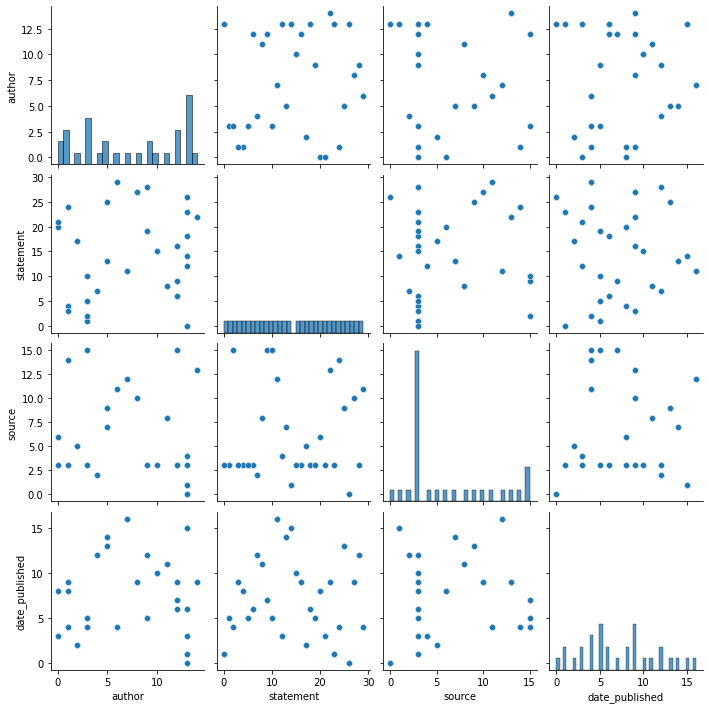

In [ ]:
g = sns.pairplot(data_politifact[['author', 'statement', 'source',	'date_published']], diag_kind="hist")
g.fig.set_size_inches(10,10)

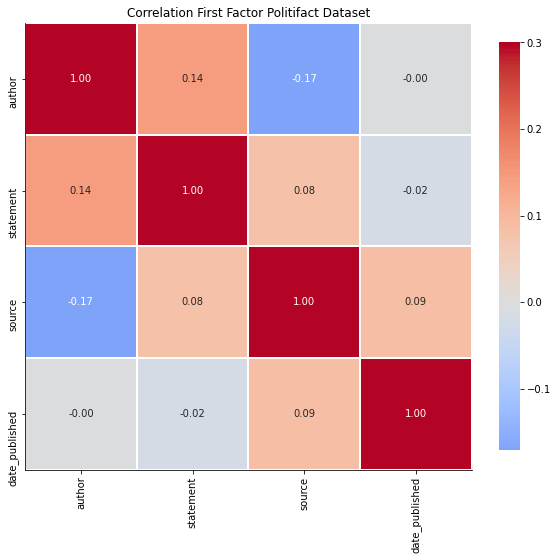

In [ ]:
corr = data_politifact[['author', 'statement', 'source',	'date_published']].corr()
g = sns.heatmap(corr,  vmax=.3, center=0,square=True, linewidths=1, cbar_kws={"shrink": 0.5}, annot=True, fmt='.2f', cmap='coolwarm')
sns.despine()
g.figure.set_size_inches(10,15)
plt.title('Correlation First Factor Politifact Dataset')
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
import time

X = data_politifact[['author', 'statement', 'source',	'date_published',]]
y = data_politifact['ratingScore']

scaler = StandardScaler()
X = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state=0)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

#second error need to convert column vector y to an 1D array as expected for training one feature
# y_train = y_train.values.ravel()

# names = ["Decision Tree", "MLP Neural Net"]
names = ["Gaussian Naive Bayes","Decision Tree", "MLP Neural Net", "RandomForestClassifier", "GradientBoostingClassifier"]

classifiers = [
    GaussianNB(var_smoothing=1e-09),
    DecisionTreeClassifier(max_depth=5),
    MLPClassifier(solver='adam',alpha=1, max_iter=1000),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    GradientBoostingClassifier(loss='deviance', learning_rate=0.1, n_estimators=100)
    ]
output = pd.DataFrame(columns=['classifier','f1-score', 'precision', 'recall', 'accuracy'])

max_score = 0.0
max_class = ''
# iterate over classifiers

for name, clf in zip(names, classifiers):

    start_time = time.process_time()
    clf.fit(X_train, y_train)
    y_predict = clf.predict(X_test)

    score = 100.0 * clf.score(X_test, y_test)

    # score = metrics.accuracy_score(y_test, y_predict)
    
    precision = np.round(metrics.precision_score(y_test, y_predict, average='macro'),2)
    recall = np.round(metrics.recall_score(y_test, y_predict, average='macro'),2)
    f1 = np.round(metrics.f1_score(y_test, y_predict, average='macro'),2)

    output = output.append({'classifier': name,'f1-score':f1, 'precision':precision,'recall':recall,'accuracy':score}, ignore_index=True)

    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name

print(80*'-' )
print('Best --> Classifier = %s, Score (test, accuracy) = %.2f' %(max_class, max_score))
display(output)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



--------------------------------------------------------------------------------
Best --> Classifier = MLP Neural Net, Score (test, accuracy) = 100.00


,classifier,f1-score,precision,recall,accuracy
0,Gaussian Naive Bayes,0.66,0.80,0.66,66.599933
1,Decision Tree,0.93,0.98,0.90,93.271049
2,MLP Neural Net,1.00,1.00,1.00,100.000000
3,RandomForestClassifier,0.97,0.99,0.95,96.752308
4,GradientBoostingClassifier,1.00,1.00,1.00,100.000000


In [ ]:
print(confusion_matrix(list(y_test), list(y_predict)))
print(accuracy_score(y_test, y_predict))

[[ 263    0    0    0    0    0    0]
 [   0  290    0    0    0    0    0]
 [   0    0  653    0    0    0    0]
 [   0    0    0  583    0    0    0]
 [   0    0    0    0  887    0    0]
 [   0    0    0    0    0 2096    0]
 [   0    0    0    0    0    0 4219]]
1.0


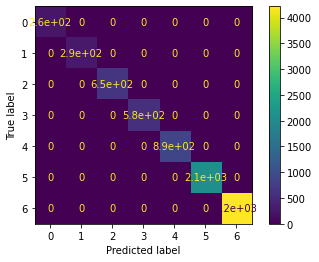

In [ ]:
plot_confusion_matrix(clf, X_test, y_test)

Pickle the first microfactor 

In [ ]:
import pickle 
filename = '/content/drive/MyDrive/Underdog/NLP Project/Sprint4/Jocelyn Baduria/created_file/pickle_file/first_sourceRatingScore_model.sav'
pickle.dump(clf, open(filename, 'wb'))
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
# Load the saved model and evaluating it provides an estimate of accuracy of the model on test data.
sourceRating = loaded_model.score(X_test, y_test)
print(sourceRating)

1.0


### Train the Politifact dataset Second Microfactor - Reputation Score
Second Factor - Reputation Score ( rating Score > 3 and more than 999 counts - Source is not reputable)

In [ ]:
# Politifact
import pandas as pd
path = '/content/drive/MyDrive/Underdog/NLP Project/Sprint4/Jocelyn Baduria/created_file/csv_file/political_fact_checker_score.csv'
data_politifact = pd.read_csv(path, parse_dates=True)

In [ ]:
data_politifact

,author,date,statement,source,date_published,target,ratingScore
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",false,6
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",false,6
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",pants-fire,5
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",pants-fire,5
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",false,6
...,...,...,...,...,...,...,...
29965,Paul Specht,"April 15, 2021",On whether he supports the filibuster.,Jeff Jackson,"April 8, 2021",no-flip,0
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",mostly-true,2
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",half-true,3
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",true,1


In [ ]:
source = data_politifact['source']

In [ ]:
source.describe()

count              29970
unique                16
top       Facebook posts
freq               12987
Name: source, dtype: object

In [ ]:
source = data_politifact['source'].unique()
source.sort()
print(source)

['Bloggers' 'Diamond and Silk' 'Douglas Frank' 'Facebook posts'
 'George Papadopoulos' 'Greg Abbott' 'Instagram posts' 'Janet Bewley'
 'Jeff Jackson' 'Mark Born' 'Pete Buttigieg' 'Richard Durbin'
 'Shelley Moore Capito' 'Terry McAuliffe' 'Tucker Carlson' 'Viral image']


In [ ]:
data_politifact.groupby('source').agg({"source":"count"})

,source
source,
Bloggers,999
Diamond and Silk,999
Douglas Frank,999
Facebook posts,12987
George Papadopoulos,999
Greg Abbott,999
Instagram posts,999
Janet Bewley,999
Jeff Jackson,999


In [ ]:
#Create a function to get the reputable source
def reputableSource(text):
  if text == 'Facebook posts':
    return 1
  if text == 'Viral image':
    return 1
  if text == 'George Papadopoulos':
    return 1
  if text == 'Diamond and Silk':
    return 1
  if text == 'Greg Abbott':
    return 1
  if text == 'Mark Born':
    return 1
  if text == 'Bloggers':
    return 1
  if text == 'Instagram posts':
    return 1
  if text == 'Tucker Carlson':
    return 1
  if text == 'Douglas Frank':
    return 1
  else:
    return 0

In [ ]:
#Store the data in the dataframe
data_politifact['reputationScore'] = data_politifact['source'].apply(reputableSource)

In [ ]:
data_politifact

,author,date,statement,source,date_published,target,ratingScore,reputationScore
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",false,6,1
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",false,6,1
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",pants-fire,5,1
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",pants-fire,5,1
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",false,6,1
...,...,...,...,...,...,...,...,...
29965,Paul Specht,"April 15, 2021",On whether he supports the filibuster.,Jeff Jackson,"April 8, 2021",no-flip,0,0
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",mostly-true,2,0
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",half-true,3,1
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",true,1,0


In [ ]:
# Save the cleaned csv data with reputation score 
path = '/content/drive/MyDrive/Underdog/NLP Project/Sprint4/Jocelyn Baduria/created_file/csv_file/political_reputation_score.csv'
data_politifact.to_csv(path, index=False)

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
# Scaling the Dataset
from sklearn.preprocessing import StandardScaler

import sklearn.metrics as metrics
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score

from sklearn.model_selection import train_test_split

from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB

In [ ]:
le = LabelEncoder()
data_politifact['author'] = le.fit_transform(data_politifact['author'])
data_politifact['source'] = le.fit_transform(data_politifact['source'])
data_politifact['statement'] = le.fit_transform(data_politifact['statement'])
data_politifact['date_published'] = le.fit_transform(data_politifact['date_published'])

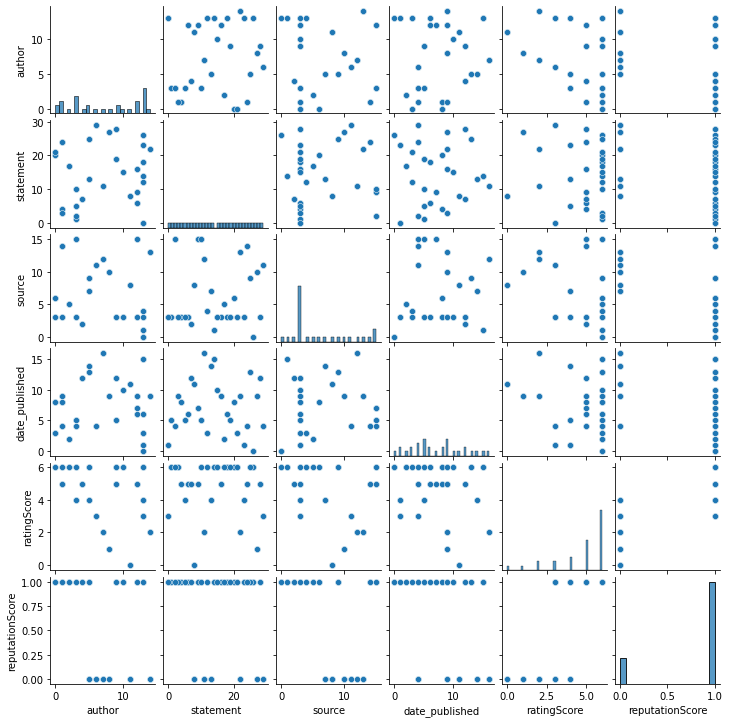

In [ ]:
g = sns.pairplot(data_politifact[['author', 'statement', 'source',	'date_published', 'ratingScore',	'reputationScore']], diag_kind="hist")
g.fig.set_size_inches(10,10)

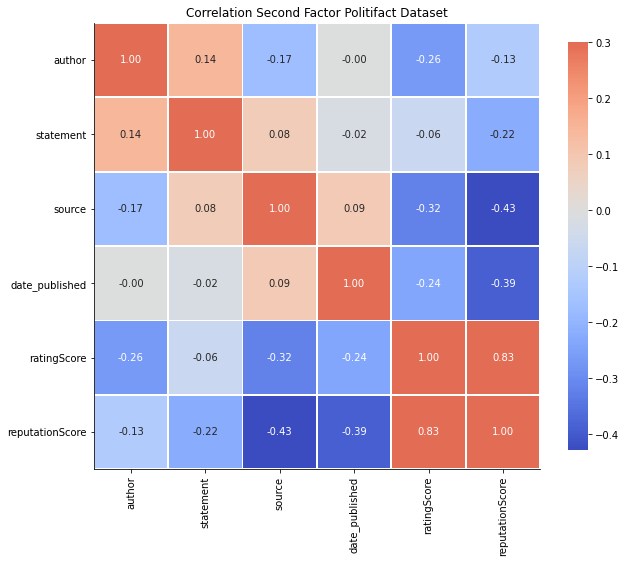

In [ ]:
corr = data_politifact[['author', 'statement', 'source',	'date_published', 'ratingScore',	'reputationScore']].corr()
g = sns.heatmap(corr,  vmax=.3, center=0,square=True, linewidths=1, cbar_kws={"shrink": 0.5}, annot=True, fmt='.2f', cmap='coolwarm')
sns.despine()
g.figure.set_size_inches(10,15)
plt.title('Correlation Second Factor Politifact Dataset')
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
import time

X = data_politifact[['author', 'statement', 'source',	'date_published', 'ratingScore']]
y = data_politifact['reputationScore']

scaler = StandardScaler()
X = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state=0)


#second error need to convert column vector y to an 1D array as expected for training one feature
# y_train = y_train.values.ravel()

# names = ["Decision Tree", "MLP Neural Net"]
names = ["Gaussian Naive Bayes","Decision Tree", "MLP Neural Net", "RandomForestClassifier", "GradientBoostingClassifier"]

classifiers = [
    GaussianNB(var_smoothing=1e-09),
    DecisionTreeClassifier(max_depth=5),
    MLPClassifier(solver='adam',alpha=1, max_iter=1000),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    GradientBoostingClassifier(loss='deviance', learning_rate=0.1, n_estimators=100)
    ]
output = pd.DataFrame(columns=['classifier','f1-score', 'precision', 'recall', 'accuracy'])

max_score = 0.0
max_class = ''
# iterate over classifiers

for name, clf in zip(names, classifiers):

    start_time = time.process_time()
    clf.fit(X_train, y_train)
    y_predict = clf.predict(X_test)

    score = 100.0 * clf.score(X_test, y_test)

    # score = metrics.accuracy_score(y_test, y_predict)
    
    precision = np.round(metrics.precision_score(y_test, y_predict, average='macro'),2)
    recall = np.round(metrics.recall_score(y_test, y_predict, average='macro'),2)
    f1 = np.round(metrics.f1_score(y_test, y_predict, average='macro'),2)

    output = output.append({'classifier': name,'f1-score':f1, 'precision':precision,'recall':recall,'accuracy':score}, ignore_index=True)

    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name

print(80*'-' )
print('Best --> Classifier = %s, Score (test, accuracy) = %.2f' %(max_class, max_score))
display(output)

--------------------------------------------------------------------------------
Best --> Classifier = Decision Tree, Score (test, accuracy) = 100.00


,classifier,f1-score,precision,recall,accuracy
0,Gaussian Naive Bayes,0.95,0.98,0.92,96.930264
1,Decision Tree,1.00,1.00,1.00,100.000000
2,MLP Neural Net,1.00,1.00,1.00,100.000000
3,RandomForestClassifier,1.00,1.00,1.00,100.000000
4,GradientBoostingClassifier,1.00,1.00,1.00,100.000000


In [ ]:
print(confusion_matrix(list(y_test), list(y_predict)))
print(accuracy_score(y_test, y_predict))

[[1801    0]
 [   0 7190]]
1.0


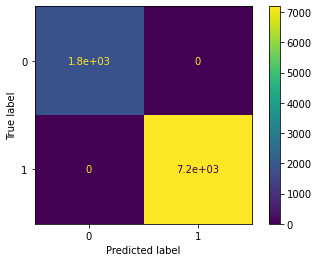

In [ ]:
plot_confusion_matrix(clf, X_test, y_test)

In [ ]:
import pickle 
filename = '/content/drive/MyDrive/Underdog/NLP Project/Sprint4/Jocelyn Baduria/created_file/pickle_file/second_reputationScore_model.sav'
pickle.dump(clf, open(filename, 'wb'))
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
# Load the saved model and evaluating it provides an estimate of accuracy of the model on test data.
reputationScore = loaded_model.score(X_test, y_test)
print(reputationScore)

1.0


### Train the Politifact dataset Third Microfactor - Sentence Similarity (Experiment)

In [ ]:
# Politifact
import pandas as pd
path = '/content/drive/MyDrive/Underdog/NLP Project/Sprint4/Jocelyn Baduria/created_file/csv_file/political_reputation_score.csv'
data_politifact = pd.read_csv(path, parse_dates=True)

In [ ]:
data_politifact

,author,date,statement,source,date_published,target,ratingScore,reputationScore
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",false,6,1
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",false,6,1
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",pants-fire,5,1
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",pants-fire,5,1
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",false,6,1
...,...,...,...,...,...,...,...,...
29965,Paul Specht,"April 15, 2021",On whether he supports the filibuster.,Jeff Jackson,"April 8, 2021",no-flip,0,0
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",mostly-true,2,0
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",half-true,3,1
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",true,1,0


In [ ]:
from sklearn.model_selection import train_test_split
X = data_politifact['statement']
y = data_politifact['statement']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state=0)

#### CountVectorizer

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
count_vect = CountVectorizer()

In [ ]:
X_politifact_train = count_vect.fit_transform(data_politifact['statement'])

In [ ]:
y_politifact_train = count_vect.fit_transform(data_politifact['statement'])

In [ ]:
y = data_politifact.iloc[1:10, [2]].values
print(y)

[['“Black Lives Matter and antifa set Catholic church on fire in Minneapolis.”']
 ['Photo shows President Barack Obama posing with a 420 sign.']
 ['Derek Chauvin’s trial and conviction for the murder of George Floyd was faked as part of a “false flag.”']
 ['Women’s menstrual cycles and fertility are affected by being around people who have received COVID-19 vaccines']
 ['“Stanford study results” show face masks are ineffective and dangerous.']
 ['“Private insurance gives … better coverage” than people would get under a Medicaid expansion.']
 ['Japan’s prime minister met with Vice President Kamala Harris holding a Trump 2024 sign and wearing a red baseball cap.']
 ['“Joe Biden and the Democrats want to remove any term that denotes gender.”']
 ['“Foot Locker donated 200 million dollars to BLM.”']]


In [ ]:
# y_politifact_train = data_politifact.iloc[0:1000, [2]].values

In [ ]:
X_politifact_train.shape

(29970, 280)

In [ ]:
y_politifact_train.shape

(29970, 280)

In [ ]:
count_vect.vocabulary_.get(u'algorithm')

In [ ]:
# count_vect.vocabulary_.get(u'algorithm')
print(count_vect.vocabulary_)

{'two': 250, 'photos': 182, 'show': 217, 'climate': 54, 'change': 49, 'is': 130, 'hoax': 114, 'black': 35, 'lives': 145, 'matter': 155, 'and': 19, 'antifa': 20, 'set': 215, 'catholic': 46, 'church': 53, 'on': 174, 'fire': 89, 'in': 123, 'minneapolis': 164, 'photo': 181, 'shows': 218, 'president': 190, 'barack': 27, 'obama': 172, 'posing': 189, 'with': 271, '420': 9, 'sign': 219, 'derek': 72, 'chauvin': 50, 'trial': 248, 'conviction': 61, 'for': 93, 'the': 239, 'murder': 167, 'of': 173, 'george': 96, 'floyd': 91, 'was': 263, 'faked': 84, 'as': 25, 'part': 179, 'false': 85, 'flag': 90, 'women': 273, 'menstrual': 159, 'cycles': 67, 'fertility': 87, 'are': 22, 'affected': 13, 'by': 41, 'being': 31, 'around': 24, 'people': 180, 'who': 269, 'have': 106, 'received': 198, 'covid': 64, '19': 3, 'vaccines': 257, 'stanford': 224, 'study': 227, 'results': 204, 'face': 82, 'masks': 153, 'ineffective': 126, 'dangerous': 68, 'private': 193, 'insurance': 127, 'gives': 98, 'better': 33, 'coverage': 63,

In [ ]:
# encode the whole document
vector_politifact = count_vect.transform(data_politifact['statement'])

In [ ]:
# summarize encoded vector
print(vector_politifact.shape)
print(type(vector_politifact))
print(vector_politifact.toarray())

(29970, 280)
<class 'scipy.sparse.csr.csr_matrix'>
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 1 0 ... 0 0 0]]


#### Tf-Idf

In [ ]:
tfidf_transformer = TfidfTransformer()
X_train_tfidf = tfidf_transformer.fit_transform(X_politifact_train)
X_train_tfidf.shape

(29970, 280)

In [ ]:
print(X_train_tfidf)

  (0, 250)	0.4086454939681444
  (0, 217)	0.3443199741137097
  (0, 182)	0.4086454939681444
  (0, 130)	0.21561089194192118
  (0, 114)	0.4086454939681444
  (0, 54)	0.4086454939681444
  (0, 49)	0.4086454939681444
  (1, 215)	0.31828775993601577
  (1, 174)	0.2180653405108099
  (1, 164)	0.31828775993601577
  (1, 155)	0.31828775993601577
  (1, 145)	0.31828775993601577
  (1, 123)	0.1517969123799922
  (1, 89)	0.31828775993601577
  (1, 53)	0.31828775993601577
  (1, 46)	0.31828775993601577
  (1, 35)	0.31828775993601577
  (1, 20)	0.31828775993601577
  (1, 19)	0.1328206367023759
  (2, 271)	0.30378421579352616
  (2, 219)	0.30378421579352616
  (2, 218)	0.30378421579352616
  (2, 190)	0.2705757257154297
  (2, 189)	0.3605368850361099
  (2, 181)	0.3605368850361099
  :	:
  (29968, 109)	0.3566226844837226
  (29968, 39)	0.3566226844837226
  (29969, 272)	0.21745661594099117
  (29969, 251)	0.43491323188198233
  (29969, 244)	0.2426666716620884
  (29969, 223)	0.21745661594099117
  (29969, 210)	0.1379587561892151

#### Naive Bayes Classifier Politifact

In [ ]:
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(X_train_tfidf, data_politifact['statement'])

In [ ]:
statement_new = ['Jimmy is my friend."']
X_new_counts = count_vect.transform(statement_new)
X_new_tfidf = tfidf_transformer.transform(X_new_counts)

predicted = clf.predict(X_new_tfidf)

In [ ]:
for doc, category in zip(statement_new, predicted):
  print('%r => %s' % (doc, predicted))

'Jimmy is my friend."' => ['A serial killer is on the loose in Virginia.']


#### Pipeline Politifact

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt  
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_roc_curve
text_clf = Pipeline([
     ('vect', CountVectorizer()),
     ('tfidf', TfidfTransformer()),
     ('clf', MultinomialNB()),
])

In [ ]:
text_clf.fit(X_train, y_train )

Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=None)),
                ('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))],
         verbose=False)

In [ ]:
from sklearn import metrics
text_clf.fit(list(X_train), list(y_train))
predicted = text_clf.predict(list(X_test))
print(metrics.classification_report(list(y_test), predicted))

                                                                                                                                                                                         precision    recall  f1-score   support

                                                                                                                           "Kids in cages" in border facilities are "at 700% capacity."       1.00      1.00      1.00       180
                                                                                                                                           A serial killer is on the loose in Virginia.       1.00      1.00      1.00       210
                                                                                                                          Coca-Cola, Ben & Jerry’s and other companies support rioting.       1.00      1.00      1.00       206
                                                                                                   

In [ ]:
cf_matrix = confusion_matrix(X_test, y_test)

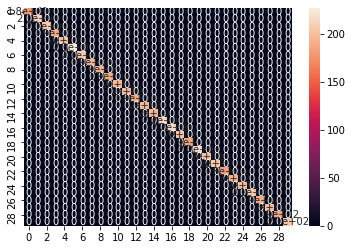

In [ ]:
import seaborn as sns
sns.heatmap(cf_matrix, annot=True)

In [ ]:
# plot_confusion_matrix(text_clf, X_test, y_test)

In [ ]:
roc_auc_score(y_test, text_clf.predict_proba(X_test), multi_class='ovr')

1.0

In [ ]:
import pickle 
filename = '/content/drive/MyDrive/Underdog/NLP Project/Sprint4/Jocelyn Baduria/created_file/pickle_file/third_sentenceSimilarity_model.sav'
pickle.dump(text_clf, open(filename, 'wb'))
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
# Load the saved model and evaluating it provides an estimate of accuracy of the model on test data.
sentenceSimilarity = loaded_model.score(X_test, y_test)
print(sentenceSimilarity)

1.0


### Test the Politifact Trained model (Third Factor Sentence Similarity) with text data from Fox News(Experiment)

Data Narrative : 

Accuracy = 3% 

Weighted Average: precision = 0.03 recall = 0.03, f1-score = 0.03


Train Test Split 

In [ ]:
from sklearn.model_selection import train_test_split
X_train = data_politifact['statement']
y_train = data_politifact['statement']
X_test = data_foxnews['headline']
y_test = data_foxnews['headline']

max_r = 57971
X_test = X_test.iloc[0:max_r]
y_test = y_test.iloc[0:max_r]
# X = X_train + X_test
# y = y_train + y_test
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state=0)

#### CountVectorizer

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
#from sklearn.feature_extraction.text import TfidfVectorizer
count_vect = CountVectorizer()

In [ ]:
X = count_vect.fit_transform(X_test)

In [ ]:
y = count_vect.fit_transform(y_test)

In [ ]:
y = data_foxnews.iloc[1:10, [1]].values
print(y)

[['WATCH: County officials ignore mother pleading for school reopening']
 ["Grocery chain closes two stores in city that required 'hero pay'"]
 ['Insider ripped for piece victimizing teachers during COVID']
 ["Photo catches Queen in rare moment of emotion at Prince Philip's funeral"]
 ['Portland church damaged in riot says cost of repairs will take away from feeding the homeless']
 ['Minneapolis drive-by shooting leaves 2 National Guard members injured']
 ['Deadly Texas crash involving Tesla worth $80,000 sparks four hour fire']
 ['Hundreds of migrant girls 13-17 abruptly moved out of Texas facility']
 ['Details emerge on how FedEx shooter obtained guns despite family concerns']]


In [ ]:
# y_politifact_train = data_politifact.iloc[0:1000, [2]].values

In [ ]:
X.shape

(57971, 1018)

In [ ]:
y.shape

(9, 1)

In [ ]:
count_vect.vocabulary_.get(u'algorithm')

In [ ]:
# count_vect.vocabulary_.get(u'algorithm')
print(count_vect.vocabulary_)

{'wisconsin': 996, 'police': 676, 'arrest': 64, 'suspect': 869, 'wanted': 967, 'for': 346, 'deadly': 244, 'shooting': 806, 'at': 74, 'kenosha': 496, 'lakeside': 508, 'bar': 87, 'watch': 971, 'county': 219, 'officials': 619, 'ignore': 448, 'mother': 594, 'pleading': 670, 'school': 783, 'reopening': 733, 'grocery': 390, 'chain': 170, 'closes': 193, 'two': 937, 'stores': 852, 'in': 455, 'city': 187, 'that': 894, 'required': 740, 'hero': 419, 'pay': 659, 'insider': 466, 'ripped': 754, 'piece': 665, 'victimizing': 955, 'teachers': 880, 'during': 285, 'covid': 223, 'photo': 664, 'catches': 164, 'queen': 701, 'rare': 710, 'moment': 586, 'of': 617, 'emotion': 300, 'prince': 689, 'philip': 662, 'funeral': 357, 'portland': 680, 'church': 185, 'damaged': 236, 'riot': 753, 'says': 780, 'cost': 217, 'repairs': 735, 'will': 989, 'take': 874, 'away': 79, 'from': 355, 'feeding': 332, 'the': 895, 'homeless': 431, 'minneapolis': 578, 'drive': 280, 'by': 148, 'leaves': 522, 'national': 601, 'guard': 393,

In [ ]:
# encode the whole document
vector_foxnews = count_vect.transform(X_test)

In [ ]:
# summarize encoded vector
print(vector_foxnews.shape)
print(type(vector_foxnews))
print(vector_foxnews.toarray())

(57971, 1018)
<class 'scipy.sparse.csr.csr_matrix'>
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


#### Tf-Idf

Fox News

In [ ]:
# Use the whole corpus of FoxNews for testing
tfidf_transformer = TfidfTransformer()
X_test_tf_idf = tfidf_transformer.fit_transform(vector_foxnews)
X_test_tf_idf.shape

(57971, 1018)

In [ ]:
print(X_test_tf_idf)

  (0, 996)	0.3329227961494772
  (0, 967)	0.3329227961494772
  (0, 869)	0.2952131874092105
  (0, 806)	0.24540122829644814
  (0, 676)	0.21979430306349246
  (0, 508)	0.3329227961494772
  (0, 496)	0.3329227961494772
  (0, 346)	0.14598317419999418
  (0, 244)	0.2952131874092105
  (0, 87)	0.3329227961494772
  (0, 74)	0.17558597075334004
  (0, 64)	0.3329227961494772
  (1, 971)	0.34133394206125034
  (1, 783)	0.29782325149526645
  (1, 733)	0.3414239241988123
  (1, 670)	0.3849348716737227
  (1, 619)	0.34133394206125034
  (1, 594)	0.29782325149526645
  (1, 448)	0.3849348716737227
  (1, 346)	0.16878992690535746
  (1, 219)	0.3849348716737227
  (2, 937)	0.3009966006794771
  (2, 894)	0.24005384084007003
  (2, 852)	0.33935550394914105
  (2, 740)	0.33935550394914105
  :	:
  (57968, 145)	0.3482893771210001
  (57968, 45)	0.3089206373440899
  (57968, 12)	0.2375431442958945
  (57969, 828)	0.34351325791250586
  (57969, 720)	0.34351325791250586
  (57969, 694)	0.34351325791250586
  (57969, 642)	0.3435132579125

#### Naive Bayes Classifier Fox News

In [ ]:
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(X_test_tf_idf, X_test)

In [ ]:
statement_new = ['chain closes two stores in city that required hero pay']
X_new_counts = count_vect.transform(statement_new)
X_new_tfidf = tfidf_transformer.transform(X_new_counts)

predicted = clf.predict(X_new_tfidf)

In [ ]:
for doc, category in zip(statement_new, predicted):
  print('%r => %s' % (doc, predicted))

'chain closes two stores in city that required hero pay' => ["Grocery chain closes two stores in city that required 'hero pay'"]


#### Trained Politifact with Test Prediction Fox News

Data Narrative : 

Accuracy score = 3%.

F1 score for each trained text samples range from 1% to 7% score.

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt  
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_roc_curve
from sklearn import metrics
text_clf = Pipeline([
     ('vect', CountVectorizer()),
     ('tfidf', TfidfTransformer()),
     ('clf', MultinomialNB()),
])

In [ ]:
text_clf.fit(X_train, y_train )

Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=None)),
                ('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))],
         verbose=False)

In [ ]:
predicted = text_clf.predict(list(y_test))
predicted

array(['"Suez Canal blocked by huge container ship named Evergreen. Evergreen shipping is most likely a cover for human and sex trafficking” by Hillary Clinton.',
       '“There’s still (only) a handful of school districts" doing no in-person instruction.',
       'Passports aren’t required to enter the United States from Mexico and Canada.',
       ...,
       '“Less than 500 people a year killed by all rifles combined” and “4,000 a year killed by illegals.”',
       '"Ted Cruz says owning a gun should be as hassle free as owning a car, which as I recall requires a license and registration."',
       '"There are 43 states that have now passed voter suppression laws."'],
      dtype='<U221')

In [ ]:
print(metrics.classification_report(list(y_train), predicted))

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



                                                                                                                                                                                                                               precision    recall  f1-score   support

"In 2004, George W. Bush lifted the ban on those (AR-15 type) rifles, and since then, the number of massacres has increased 183%. During the ban, there were 12 incidents. Since he lifted the ban, there were 34 incidents."       0.03      0.04      0.04      1999
                            "Joe Biden forced the U.S. Attorney for the Eastern District of North Carolina to resign after 24 people were charged with election fraud and the Mainstream Media never even batted an eyelash."       0.03      0.14      0.06      1999
                "Since 2006 Texas has given $19B in taxpayer subsidies to wind energy companies. Over the past 2-3 years Texas has tripled our dependence on wind energy to 23-25 percent of our energy distributi

In [ ]:
cf_matrix = confusion_matrix(y_train, predicted)

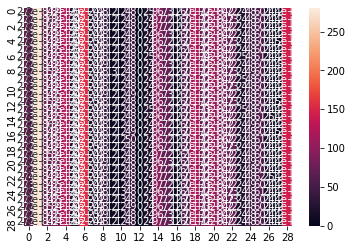

In [ ]:
import seaborn as sns
sns.heatmap(cf_matrix, annot=True)

In [ ]:
# plot_confusion_matrix(text_clf, y_train, predicted)

In [ ]:
roc_auc_score(y_train, text_clf.predict_proba(X_train), multi_class='ovr')

1.0

In [ ]:
import pickle 
filename = '/content/drive/MyDrive/cmpe-257 Machine Leaning/Pickle_model/Naive_Bayes_Politifact_trained_FoxNews_test_model.sav'
pickle.dump(text_clf, open(filename, 'wb'))
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
# Load the saved model and evaluating it provides an estimate of accuracy of the model on test data.
result = loaded_model.score(X_test, y_test)
print(result)

0.0


#### Amalgamated the Fox News to Political Database, perform KMeans and inference

Data Narrative :

Accuracy Score = 100%, F1 score = 1.

In [ ]:
date_politifact = data_politifact['date']
statement_politifact = data_politifact['statement']
date_foxnews = data_foxnews['date']
headline_foxnews = data_foxnews['headline']

In [ ]:
date = [date_politifact, date_foxnews]

In [ ]:
date = date_politifact.append(date_foxnews)

In [ ]:
text = [statement_politifact, headline_foxnews]

In [ ]:
text = statement_politifact.append(headline_foxnews)

In [ ]:
combined_Data = pd.concat([date, text], axis=1)

In [ ]:
combined_Data.head(2)

,date,0
0,"March 30, 2021",“Less than 500 people a year killed by all rif...
1,"March 30, 2021",Says the suspected Boulder mass shooter is a M...


In [ ]:
combined_Data.columns =['date', 'text']

In [ ]:
combined_Data.head(2)

,date,text
0,"March 30, 2021",“Less than 500 people a year killed by all rif...
1,"March 30, 2021",Says the suspected Boulder mass shooter is a M...


In [ ]:
combined_Data.describe()

,date,text
count,389971,389971
unique,15,158
top,2021-04-18,Insider ripped for piece victimizing teachers ...
freq,190000,6000


In [ ]:
combined_Data

,date,text
0,"March 30, 2021",“Less than 500 people a year killed by all rif...
1,"March 30, 2021",Says the suspected Boulder mass shooter is a M...
2,"March 30, 2021",“Toxicology report was made public by the MN p...
3,"March 30, 2021","Says Jimmy Kimmel, Jimmy Fallon and Stephen Co..."
4,"March 29, 2021",Says Google Earth blocked people from seeing t...
...,...,...
331995,2021-04-18,Minnesota armed carjacker points gun at vehicl...
331996,2021-04-18,Houston police say crystal meth found in break...
331997,2021-04-18,Minneapolis drive-by shooting leaves 2 Nationa...
331998,2021-04-18,Man charged with attacking undercover NYPD cop...


In [ ]:
# Save amalgamated cleaned Politifact and FoxNews scraped data into csv file
path = '/content/drive/MyDrive/cmpe-257 Machine Leaning/scraped_data/saved_csv/combined_political_foxnews_2000.csv'
combined_Data.to_csv(path, index=False)

#### Create Downsample (1000) Amalgamated dataset and perform KMeans and inference

Data Narrative :

Accuracy = 90% Weighted Average: precision = 85% recall = 90%, f1-score = 87%

#### Downsample

In [ ]:
# Politifact
import pandas as pd
path = '/content/drive/MyDrive/cmpe-257 Machine Leaning/scraped_data/saved_csv/clean_political_fact_checker_2000.csv'
data_politifact = pd.read_csv(path, parse_dates=True)

In [ ]:
# Fox News
import pandas as pd
path = '/content/drive/MyDrive/cmpe-257 Machine Leaning/scraped_data/saved_csv/foxnews_2000.csv'
data_foxnews = pd.read_csv(path, parse_dates=True)

In [ ]:
date_politifact = data_politifact['date']
statement_politifact = data_politifact['statement']
date_foxnews = data_foxnews['date']
headline_foxnews = data_foxnews['headline']

In [ ]:
max = 1000

date_politifact = date_politifact.iloc[0:max]
statement_politifact = statement_politifact.iloc[0:max]
date_foxnews = date_foxnews.iloc[0:max]
headline_foxnews = headline_foxnews.iloc[0:max]

In [ ]:
headline_foxnews

0      Wisconsin police arrest suspect wanted for dea...
1      WATCH: County officials ignore mother pleading...
2      Grocery chain closes two stores in city that r...
3      Insider ripped for piece victimizing teachers ...
4      Photo catches Queen in rare moment of emotion ...
                             ...                        
995    Portland church damaged in riot says cost of r...
996    Wisconsin police arrest suspect wanted for dea...
997    WATCH: County officials ignore mother pleading...
998    Grocery chain closes two stores in city that r...
999    Insider ripped for piece victimizing teachers ...
Name: headline, Length: 1000, dtype: object

In [ ]:
date = [date_politifact, date_foxnews]

In [ ]:
date = date_politifact.append(date_foxnews)

In [ ]:
text = [statement_politifact, headline_foxnews]

In [ ]:
text = statement_politifact.append(headline_foxnews)

In [ ]:
combined_Data = pd.concat([date, text], axis=1)

In [ ]:
combined_Data.head(2)

,date,0
0,"March 30, 2021",“Less than 500 people a year killed by all rif...
1,"March 30, 2021",Says the suspected Boulder mass shooter is a M...


In [ ]:
combined_Data.columns =['date', 'text']

In [ ]:
combined_Data.head(2)

,date,text
0,"March 30, 2021",“Less than 500 people a year killed by all rif...
1,"March 30, 2021",Says the suspected Boulder mass shooter is a M...


In [ ]:
combined_Data.describe()

,date,text
count,2000,2000
unique,15,158
top,2021-04-18,Says the suspected Boulder mass shooter is a M...
freq,574,35


In [ ]:
combined_Data

,date,text
0,"March 30, 2021",“Less than 500 people a year killed by all rif...
1,"March 30, 2021",Says the suspected Boulder mass shooter is a M...
2,"March 30, 2021",“Toxicology report was made public by the MN p...
3,"March 30, 2021","Says Jimmy Kimmel, Jimmy Fallon and Stephen Co..."
4,"March 29, 2021",Says Google Earth blocked people from seeing t...
...,...,...
995,2021-04-18,Portland church damaged in riot says cost of r...
996,2021-04-18,Wisconsin police arrest suspect wanted for dea...
997,2021-04-18,WATCH: County officials ignore mother pleading...
998,2021-04-18,Grocery chain closes two stores in city that r...


In [ ]:
# Save amalgamated cleaned Politifact and FoxNews scraped data into csv file
path = '/content/drive/MyDrive/cmpe-257 Machine Leaning/scraped_data/saved_csv/for_kmeans_combined_political_foxnews_2000.csv'
combined_Data.to_csv(path, index=False)

#### Naive Bayes Classifier Amalgamated Dataset


In [ ]:
import numpy as np 
import pandas as pd 
import nltk
import string
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_roc_curve
from numpy import concatenate
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize
from sklearn.metrics import pairwise_distances
from sklearn.model_selection import train_test_split

Load Data

In [ ]:
# Load amalgamated scraped dataset
import pandas as pd
path = '/content/drive/MyDrive/cmpe-257 Machine Leaning/scraped_data/saved_csv/for_kmeans_combined_political_foxnews_2000.csv'
combinedKmeans_Data = pd.read_csv(path, parse_dates=True)

In [ ]:
combinedKmeans_Data

,date,text
0,"March 30, 2021",“Less than 500 people a year killed by all rif...
1,"March 30, 2021",Says the suspected Boulder mass shooter is a M...
2,"March 30, 2021",“Toxicology report was made public by the MN p...
3,"March 30, 2021","Says Jimmy Kimmel, Jimmy Fallon and Stephen Co..."
4,"March 29, 2021",Says Google Earth blocked people from seeing t...
...,...,...
1995,2021-04-18,Portland church damaged in riot says cost of r...
1996,2021-04-18,Wisconsin police arrest suspect wanted for dea...
1997,2021-04-18,WATCH: County officials ignore mother pleading...
1998,2021-04-18,Grocery chain closes two stores in city that r...


In [ ]:
X = combinedKmeans_Data['text']
y = combinedKmeans_Data['text']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state=0)

In [ ]:
X

0       “Less than 500 people a year killed by all rif...
1       Says the suspected Boulder mass shooter is a M...
2       “Toxicology report was made public by the MN p...
3       Says Jimmy Kimmel, Jimmy Fallon and Stephen Co...
4       Says Google Earth blocked people from seeing t...
                              ...                        
1995    Portland church damaged in riot says cost of r...
1996    Wisconsin police arrest suspect wanted for dea...
1997    WATCH: County officials ignore mother pleading...
1998    Grocery chain closes two stores in city that r...
1999    Insider ripped for piece victimizing teachers ...
Name: text, Length: 2000, dtype: object

In [ ]:
X_train

582     “Toxicology report was made public by the MN p...
159     The Democratic clean energy plan is pro-China,...
1827    Minneapolis drive-by shooting leaves 2 Nationa...
318     "In 2004, George W. Bush lifted the ban on tho...
708     “There’s still (only) a handful of school dist...
                              ...                        
835     “We had the highest number of (military) sexua...
1216    Rep. Devin Nunes: China's 'laughing' at Biden ...
1653    Florida man drives lawn mower across state on ...
559     "Joe Biden forced the U.S. Attorney for the Ea...
684     “Sorry Dr Fauci and other fearmongers, new stu...
Name: text, Length: 1600, dtype: object

In [ ]:
y_train

582     “Toxicology report was made public by the MN p...
159     The Democratic clean energy plan is pro-China,...
1827    Minneapolis drive-by shooting leaves 2 Nationa...
318     "In 2004, George W. Bush lifted the ban on tho...
708     “There’s still (only) a handful of school dist...
                              ...                        
835     “We had the highest number of (military) sexua...
1216    Rep. Devin Nunes: China's 'laughing' at Biden ...
1653    Florida man drives lawn mower across state on ...
559     "Joe Biden forced the U.S. Attorney for the Ea...
684     “Sorry Dr Fauci and other fearmongers, new stu...
Name: text, Length: 1600, dtype: object

In [ ]:
X_test

405     "In 2004, George W. Bush lifted the ban on tho...
1190    Ben Askren's reaction post-match goes viral af...
1132    Woman shows off pants almost as tall as she is...
731     A Georgia law has not “criminalized giving peo...
1754    Bam! Adebayo's jumper lifts Heat past Nets, 10...
                              ...                        
638     “Less than 500 people a year killed by all rif...
360     “There’s still (only) a handful of school dist...
1810    Have $100,000 in student debt? 5 ways to help ...
1743    Tina Turner documentary fails to examine her a...
563     “There’s still (only) a handful of school dist...
Name: text, Length: 400, dtype: object

In [ ]:
y_test

405     "In 2004, George W. Bush lifted the ban on tho...
1190    Ben Askren's reaction post-match goes viral af...
1132    Woman shows off pants almost as tall as she is...
731     A Georgia law has not “criminalized giving peo...
1754    Bam! Adebayo's jumper lifts Heat past Nets, 10...
                              ...                        
638     “Less than 500 people a year killed by all rif...
360     “There’s still (only) a handful of school dist...
1810    Have $100,000 in student debt? 5 ways to help ...
1743    Tina Turner documentary fails to examine her a...
563     “There’s still (only) a handful of school dist...
Name: text, Length: 400, dtype: object

In [ ]:
# Base Pipeline 
text_clf = Pipeline([
     ('vect', TfidfVectorizer()),
     ('tfidf', TfidfTransformer()),
     ('clf', MultinomialNB())
])

In [ ]:
text_clf.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('vect',
                 TfidfVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.float64'>,
                                 encoding='utf-8', input='content',
                                 lowercase=True, max_df=1.0, max_features=None,
                                 min_df=1, ngram_range=(1, 1), norm='l2',
                                 preprocessor=None, smooth_idf=True,
                                 stop_words=None, strip_accents=None,
                                 sublinear_tf=False,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, use_idf=True,
                                 vocabulary=None)),
                ('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
              

In [ ]:
predicted = text_clf.predict(list(y_test))
predicted

array(['"In 2004, George W. Bush lifted the ban on those (AR-15 type) rifles, and since then, the number of massacres has increased 183%. During the ban, there were 12 incidents. Since he lifted the ban, there were 34 incidents."',
       '“Less than 500 people a year killed by all rifles combined” and “4,000 a year killed by illegals.”',
       'Woman shows off pants almost as tall as she is in online shopping fail',
       'A Georgia law has not “criminalized giving people bottles of water.” It pertains to political organizations.',
       "Bam! Adebayo's jumper lifts Heat past Nets, 109-107",
       'Prince William asked to not walk beside Harry at Philip’s funeral',
       'Bitcoin slumps 14% as pullback from record high gathers pace',
       "Bride asks Facebook if it's OK to make 9-year-old don shapewear with her 'snug' dress",
       "Eli Steele: Georgia's political confusion sparks pain for everyday people",
       '“You can’t tell me they can (develop a safe vaccine) in eight 

In [ ]:
# from sklearn import metrics
# text_clf.fit(list(X_train), list(y_train))

In [ ]:
print(metrics.classification_report(list(y_test), predicted))

                                                                                                                                                                                                                               precision    recall  f1-score   support

"In 2004, George W. Bush lifted the ban on those (AR-15 type) rifles, and since then, the number of massacres has increased 183%. During the ban, there were 12 incidents. Since he lifted the ban, there were 34 incidents."       1.00      1.00      1.00        10
                            "Joe Biden forced the U.S. Attorney for the Eastern District of North Carolina to resign after 24 people were charged with election fraud and the Mainstream Media never even batted an eyelash."       1.00      1.00      1.00        12
                "Since 2006 Texas has given $19B in taxpayer subsidies to wind energy companies. Over the past 2-3 years Texas has tripled our dependence on wind energy to 23-25 percent of our energy distributi

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
cf_matrix = confusion_matrix(y_test, predicted)

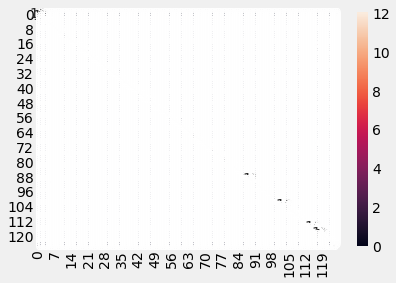

In [ ]:
import seaborn as sns
sns.heatmap(cf_matrix, annot=True)

In [ ]:
roc_auc_score(y_train, text_clf.predict_proba(X_train), multi_class='ovr')

1.0

In [ ]:
# Save the Model
import pickle 
filename = '/content/drive/MyDrive/cmpe-257 Machine Leaning/Pickle_model/Kmeans_Amalgamated_data_model.sav'
pickle.dump(text_clf, open(filename, 'wb'))
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
# Load the saved model and evaluating it provides an estimate of accuracy of the model on test data.
result = loaded_model.score(X_test, y_test)
print(result)

0.895


#### KMeans

Data Narrative:

Text Averaging using KMeans modeling defines the segmentation of text labels from two amalgamated dataset (Politifact and Fox News). 

These words are unique words in all the documents combined but frequent in a whole corpus.

Found Three Clusters of top 15 important words based on TF-idf score.

In [ ]:
import numpy as np 
import pandas as pd 
from sklearn.cluster import KMeans 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize
from sklearn.metrics import pairwise_distances

import nltk
import string

import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')

Vectorizer

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words = 'english', max_features = 20000)
X = vectorizer.fit_transform(X_train)
# Normalize the Words
tf_idf_norm = normalize(X)
tf_idf_array = tf_idf_norm.toarray()

In [ ]:
pd.DataFrame(tf_idf_array, columns=vectorizer.get_feature_names()).head()

,000,10,100,107,109,10th,12,13,14,15,16,17,18,183,19,19b,2004,2006,2019,2020,2021,23,24,25,28,2g,30,31,34,3rd,43,47,500,50s,60,70,78,80,90,able,...,water,waters,ways,wear,weary,wedding,week,weigh,welcome,weren,west,white,wide,wife,william,wilson,win,wind,wing,wins,wiping,wisconsin,witness,wives,woman,women,won,word,worker,world,worldview,worldwide,worse,worth,year,years,yield,york,yorkers,zoonotic
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.213748,0.392601,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.195543,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.179447,0.0,0.0,0.18602,0.0,0.0,0.0,0.18602,0.0,0.0,0.178265,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.174934,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


PCA Reduction Dimensionality 

In [ ]:
sklearn_pca = PCA(n_components = 2)
Y_sklearn = sklearn_pca.fit_transform(tf_idf_array)

Elbow Method

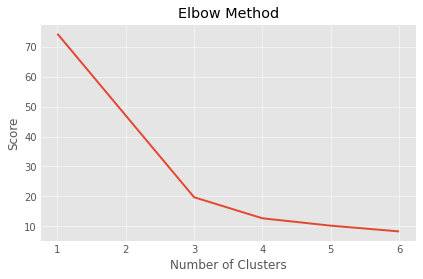

In [ ]:
number_clusters = range(1, 7)

kmeans = [KMeans(n_clusters=i, max_iter = 600) for i in number_clusters]

score = [kmeans[i].fit(Y_sklearn).score(Y_sklearn) for i in range(len(kmeans))]
score = [i*-1 for i in score]

plt.plot(number_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Method')
plt.show()

KMeans

Text(0.5, 1.0, 'Text Headlines Segmentation')

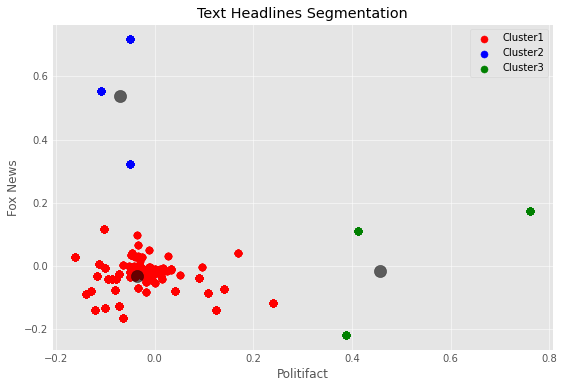

In [ ]:
kmeans = KMeans(n_clusters=3, init='k-means++')

sklearn_pca = PCA(n_components = 2)
Y_sklearn = sklearn_pca.fit_transform(tf_idf_array)
kmeans = KMeans(n_clusters=3, max_iter=600, algorithm = 'auto')
fitted = kmeans.fit(Y_sklearn)
prediction = kmeans.predict(Y_sklearn)
plt.figure(figsize=(8,6))
plt.scatter(Y_sklearn[predicted_values == 0, 0], Y_sklearn[predicted_values == 0, 1], c='red', s=50, cmap='viridis', label='Cluster1')
plt.scatter(Y_sklearn[predicted_values == 1, 0], Y_sklearn[predicted_values == 1, 1], c='blue', s=50, cmap='viridis', label='Cluster2')
plt.scatter(Y_sklearn[predicted_values == 2, 0], Y_sklearn[predicted_values == 2, 1], c='green', s=50, cmap='viridis', label='Cluster3')

centers = fitted.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=150, alpha=0.6);
plt.xlabel('Politifact')
plt.ylabel('Fox News')
plt.legend()
plt.title('Text Headlines Segmentation')

In [ ]:
# Save the Model
import pickle 
filename = '/content/drive/MyDrive/cmpe-257 Machine Leaning/Pickle_model/KmeansModel_Amalgamated_data_model.sav'
pickle.dump(kmeans, open(filename, 'wb'))
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
# Load the saved PCA model and evaluating it provides an estimate of accuracy of the model on test data.
result = loaded_model.score(Y_sklearn, prediction)
print(result)

-19.70273990994692


Top Words based on Tf-idf

In [ ]:
def get_top_features_cluster(tf_idf_array, prediction, n_feats):
    labels = np.unique(prediction)
    dfs = []
    for label in labels:
        id_temp = np.where(prediction==label) # indices for each cluster
        x_means = np.mean(tf_idf_array[id_temp], axis = 0) # returns average score across cluster
        sorted_means = np.argsort(x_means)[::-1][:n_feats] # indices with top 20 scores
        features = vectorizer.get_feature_names()
        best_features = [(features[i], x_means[i]) for i in sorted_means]
        df = pd.DataFrame(best_features, columns = ['features', 'score'])
        dfs.append(df)
    return dfs
dfs = get_top_features_cluster(tf_idf_array, prediction, 15)

In [ ]:
dfs

[     features     score
 0        year  0.021393
 1      states  0.016469
 2        says  0.015548
 3      people  0.015456
 4       doing  0.013728
 5   pandemics  0.013615
 6      killed  0.013352
 7       covid  0.013111
 8     georgia  0.013098
 9      school  0.013068
 10     passed  0.012988
 11   majority  0.012922
 12      jimmy  0.012810
 13        new  0.012319
 14   released  0.011973,     features     score
 0         90  0.245820
 1     energy  0.234861
 2       wind  0.179535
 3      china  0.150595
 4       wall  0.125764
 5       quit  0.125764
 6      spent  0.125764
 7   billions  0.125764
 8   finished  0.125764
 9      texas  0.110229
 10    border  0.102941
 11       pro  0.079298
 12  machines  0.079298
 13     solar  0.079298
 14  minerals  0.079298,          features     score
 0        increase  0.179123
 1          seeing  0.165324
 2         blocked  0.144653
 3            suez  0.139989
 4           canal  0.139989
 5            says  0.115463
 6          g

Plot the Top 15 Words measured by TfIdf from Three Clusters 

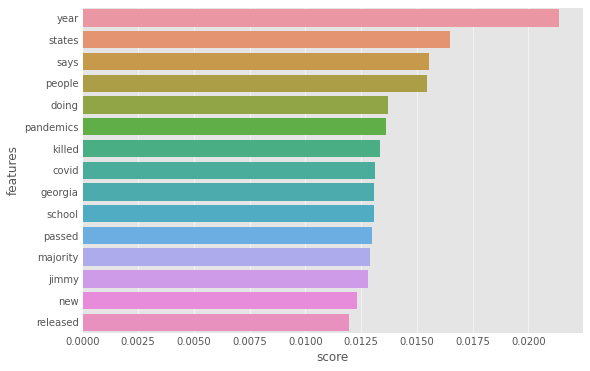

In [ ]:
import seaborn as sns
plt.figure(figsize=(8,6))
sns.barplot(x = 'score' , y = 'features', orient = 'h' , data = dfs[0][:15])

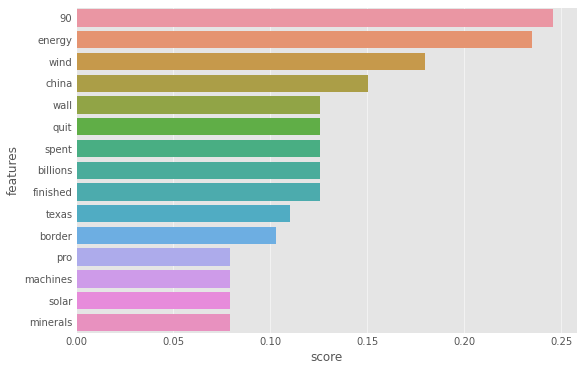

In [ ]:
plt.figure(figsize=(8,6))
sns.barplot(x = 'score' , y = 'features', orient = 'h' , data = dfs[1][:15])

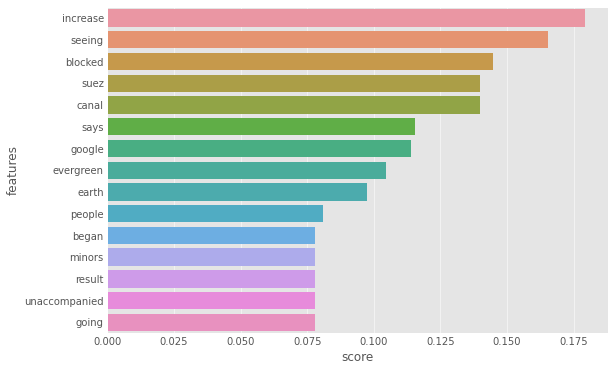

In [ ]:
plt.figure(figsize=(8,6))
sns.barplot(x = 'score' , y = 'features', orient = 'h' , data = dfs[2][:15])

In [ ]:
# save the Clusters 
for i, df in enumerate(dfs):
    df.to_csv('/content/drive/MyDrive/cmpe-257 Machine Leaning/Kmeans/kmeans_'+str(i)+'.csv')

In [ ]:
df

,features,score
0,energy,0.344462
1,wind,0.263318
2,china,0.220873
3,90,0.202844
4,texas,0.161669
5,clean,0.116304
6,plan,0.116304
7,pro,0.116304
8,solar,0.116304
9,asia,0.116304


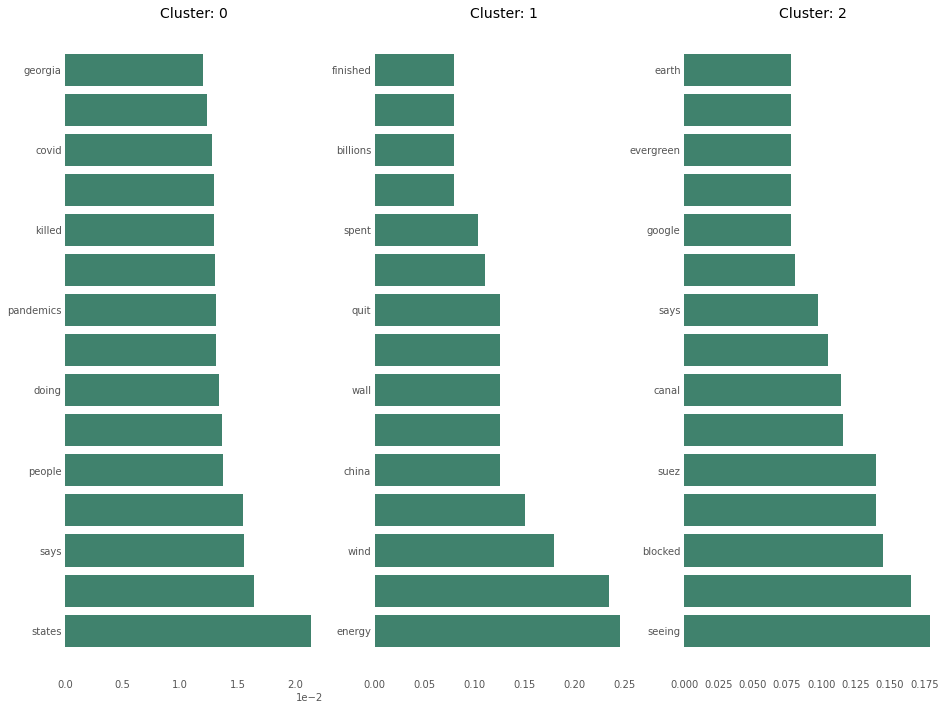

In [ ]:
def plot_features(dfs):
    fig = plt.figure(figsize=(14,12))
    x = np.arange(len(dfs[0]))
    for i, df in enumerate(dfs):
        ax = fig.add_subplot(1, len(dfs), i+1)
        ax.set_title("Cluster: "+ str(i), fontsize = 14)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.set_frame_on(False)
        ax.get_xaxis().tick_bottom()
        ax.get_yaxis().tick_left()
        ax.ticklabel_format(axis='x', style='sci', scilimits=(-2,2))
        ax.barh(x, df.score, align='center', color='#40826d')
        yticks = ax.set_yticklabels(df.features)
    plt.show();
plot_features(dfs)

### Combine microfactors for Third Microfactor Reputation

In [4]:
# Politifact
import pandas as pd
path = '/content/drive/MyDrive/Underdog/NLP Project/Sprint4/Jocelyn Baduria/created_file/csv_file/political_reputation_score.csv'
data_politifact = pd.read_csv(path, parse_dates=True)
data_politifact

,author,date,statement,source,date_published,target,ratingScore,reputationScore
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",false,6,1
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",false,6,1
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",pants-fire,5,1
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",pants-fire,5,1
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",false,6,1
...,...,...,...,...,...,...,...,...
29965,Paul Specht,"April 15, 2021",On whether he supports the filibuster.,Jeff Jackson,"April 8, 2021",no-flip,0,0
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",mostly-true,2,0
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",half-true,3,1
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",true,1,0


In [5]:
data_politifact['reputation'] = (0.15 * data_politifact['ratingScore'] + 0.85 * data_politifact['reputationScore']).astype(int)
data_politifact

,author,date,statement,source,date_published,target,ratingScore,reputationScore,reputation
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",false,6,1,1
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",false,6,1,1
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",pants-fire,5,1,1
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",pants-fire,5,1,1
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",false,6,1,1
...,...,...,...,...,...,...,...,...,...
29965,Paul Specht,"April 15, 2021",On whether he supports the filibuster.,Jeff Jackson,"April 8, 2021",no-flip,0,0,0
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",mostly-true,2,0,0
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",half-true,3,1,1
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",true,1,0,0


In [6]:
data_politifact["reputation"].value_counts()

1    23976
0     5994
Name: reputation, dtype: int64

#### Classification

In [7]:
X = data_politifact['statement']
y = data_politifact['reputation']
len(X)

29970

In [8]:
import nltk
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [9]:
lemmatizer = WordNetLemmatizer()
corpus = []
for i in range(0, len(X)):
    review = re.sub('[^a-zA-Z0-9]', ' ', X[i])
    review = review.lower()
    review = review.split()
    
    review = [lemmatizer.lemmatize(word) for word in review if not word in stopwords.words('english')]
    review = ' '.join(review)
    corpus.append(review)

In [10]:
from sklearn.feature_extraction.text import TfidfVectorizer
#tfidf_v = TfidfVectorizer(max_features=5000, ngram_range=(1,3))
tfidf_v = TfidfVectorizer(max_features=100, ngram_range=(1,3))
X = tfidf_v.fit_transform(corpus).toarray()

In [11]:
## Divide the dataset into Train and Test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=0)

In [12]:
from imblearn.combine import SMOTETomek
os = SMOTETomek(0.8)

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [14]:
X_train_ns, y_train_ns = os.fit_resample(X_train, y_train)
print("The number of classes before fit {}".format((y_train)))
print("The number of classes before fit {}".format((y_train_ns)))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


The number of classes before fit 572      1
1808     1
20987    1
15994    1
27643    1
        ..
13123    1
19648    0
9845     1
10799    1
2732     1
Name: reputation, Length: 20079, dtype: int64
The number of classes before fit [1 1 1 ... 0 0 0]


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [17]:
import time

# names = ["Decision Tree", "MLP Neural Net"]
names = ["Gaussian Naive Bayes","Decision Tree", "MLP Neural Net", "RandomForestClassifier", "GradientBoostingClassifier"]

classifiers = [
    GaussianNB(var_smoothing=1e-09),
    DecisionTreeClassifier(max_depth=5),
    MLPClassifier(solver='adam',alpha=1, max_iter=1000),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    GradientBoostingClassifier(loss='deviance', learning_rate=0.1, n_estimators=100)
    ]
output = pd.DataFrame(columns=['classifier','f1-score', 'precision', 'recall', 'accuracy'])

max_score = 0.0
max_class = ''
# iterate over classifiers

for name, clf in zip(names, classifiers):

    start_time = time.process_time()
    clf.fit(X_train_ns, y_train_ns)
    y_predict = clf.predict(X_test)

    score = 100.0 * clf.score(X_test, y_test)

    # score = metrics.accuracy_score(y_test, y_predict)
    
    precision = np.round(metrics.precision_score(y_test, y_predict, average='macro'),2)
    recall = np.round(metrics.recall_score(y_test, y_predict, average='macro'),2)
    f1 = np.round(metrics.f1_score(y_test, y_predict, average='macro'),2)

    output = output.append({'classifier': name,'f1-score':f1, 'precision':precision,'recall':recall,'accuracy':score}, ignore_index=True)

    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name

print(80*'-' )
print('Best --> Classifier = %s, Score (test, accuracy) = %.2f' %(max_class, max_score))
display(output)

--------------------------------------------------------------------------------
Best --> Classifier = Decision Tree, Score (test, accuracy) = 100.00


,classifier,f1-score,precision,recall,accuracy
0,Gaussian Naive Bayes,0.95,0.93,0.98,96.815287
1,Decision Tree,1.00,1.00,1.00,100.000000
2,MLP Neural Net,1.00,1.00,1.00,100.000000
3,RandomForestClassifier,0.88,0.96,0.84,93.620463
4,GradientBoostingClassifier,1.00,1.00,1.00,100.000000


In [19]:
print(confusion_matrix(list(y_test), list(y_predict)))
print(accuracy_score(y_test, y_predict))

[[1937    0]
 [   0 7954]]
1.0


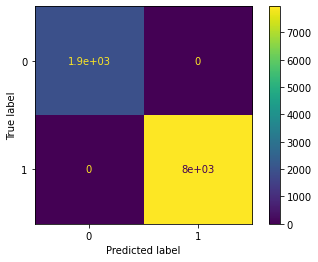

In [20]:
plot_confusion_matrix(clf, X_test, y_test)

In [22]:
X_ns, y_ns = os.fit_resample(X, y)
print("The number of classes before fit {}".format((y)))
print("The number of classes before fit {}".format((y_ns)))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


The number of classes before fit 0        1
1        1
2        1
3        1
4        1
        ..
29965    0
29966    0
29967    1
29968    0
29969    1
Name: reputation, Length: 29970, dtype: int64
The number of classes before fit [1 1 1 ... 0 0 0]


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [23]:
import pickle

#save model
mod = MLPClassifier(solver='adam',alpha=1, max_iter=1000)

mod.fit(X_ns, y_ns)  

filename = '/content/drive/MyDrive/Underdog/NLP Project/Sprint5/Model & Data files/reputation_model.sav'
pickle.dump(mod, open(filename, 'wb'))

### Model Inference

In [24]:

data_politifact['Source Reputation'] = (0.15 * data_politifact['ratingScore'] + 0.25 * data_politifact['reputationScore'] + 0.6 * data_politifact['reputation']).astype(int)

In [25]:
data_politifact

,author,date,statement,source,date_published,target,ratingScore,reputationScore,reputation,Source Reputation
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",false,6,1,1,1
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",false,6,1,1,1
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",pants-fire,5,1,1,1
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",pants-fire,5,1,1,1
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",false,6,1,1,1
...,...,...,...,...,...,...,...,...,...,...
29965,Paul Specht,"April 15, 2021",On whether he supports the filibuster.,Jeff Jackson,"April 8, 2021",no-flip,0,0,0,0
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",mostly-true,2,0,0,0
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",half-true,3,1,1,1
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",true,1,0,0,0


In [26]:
data_politifact['Source Reputation'].unique()

array([1, 0])

In [27]:
X = data_politifact['statement']
y = data_politifact['Source Reputation']
len(X)

29970

In [28]:
import nltk
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [29]:
lemmatizer = WordNetLemmatizer()
corpus = []
for i in range(0, len(X)):
    review = re.sub('[^a-zA-Z0-9]', ' ', X[i])
    review = review.lower()
    review = review.split()
    
    review = [lemmatizer.lemmatize(word) for word in review if not word in stopwords.words('english')]
    review = ' '.join(review)
    corpus.append(review)

In [30]:
from sklearn.feature_extraction.text import TfidfVectorizer
#tfidf_v = TfidfVectorizer(max_features=5000, ngram_range=(1,3))
tfidf_v = TfidfVectorizer(max_features=100, ngram_range=(1,3))
X = tfidf_v.fit_transform(corpus).toarray()

In [31]:
## Divide the dataset into Train and Test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=0)

In [32]:
from imblearn.combine import SMOTETomek
os = SMOTETomek(0.8)

In [33]:
X_train_ns, y_train_ns = os.fit_resample(X_train, y_train)
print("The number of classes before fit {}".format(y_train))
print("The number of classes before fit {}".format(y_train_ns))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


The number of classes before fit 572      1
1808     1
20987    1
15994    1
27643    1
        ..
13123    1
19648    0
9845     1
10799    1
2732     1
Name: Source Reputation, Length: 20079, dtype: int64
The number of classes before fit [1 1 1 ... 0 0 0]


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [34]:
import time
import numpy as np

# names = ["Decision Tree", "MLP Neural Net"]
names = ["Gaussian Naive Bayes","Decision Tree", "MLP Neural Net", "RandomForestClassifier", "GradientBoostingClassifier"]

classifiers = [
    GaussianNB(var_smoothing=1e-09),
    DecisionTreeClassifier(max_depth=5),
    MLPClassifier(solver='adam',alpha=1, max_iter=1000),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    GradientBoostingClassifier(loss='deviance', learning_rate=0.1, n_estimators=100)
    ]
output = pd.DataFrame(columns=['classifier','f1-score', 'precision', 'recall', 'accuracy'])

max_score = 0.0
max_class = ''
# iterate over classifiers

for name, clf in zip(names, classifiers):

    start_time = time.process_time()
    clf.fit(X_train_ns, y_train_ns)
    y_predict = clf.predict(X_test)

    score = 100.0 * clf.score(X_test, y_test)

    # score = metrics.accuracy_score(y_test, y_predict)
    
    precision = np.round(metrics.precision_score(y_test, y_predict, average='macro'),2)
    recall = np.round(metrics.recall_score(y_test, y_predict, average='macro'),2)
    f1 = np.round(metrics.f1_score(y_test, y_predict, average='macro'),2)

    output = output.append({'classifier': name,'f1-score':f1, 'precision':precision,'recall':recall,'accuracy':score}, ignore_index=True)

    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name

print(80*'-' )
print('Best --> Classifier = %s, Score (test, accuracy) = %.2f' %(max_class, max_score))
display(output)

--------------------------------------------------------------------------------
Best --> Classifier = Decision Tree, Score (test, accuracy) = 100.00


,classifier,f1-score,precision,recall,accuracy
0,Gaussian Naive Bayes,0.95,0.93,0.98,96.815287
1,Decision Tree,1.00,1.00,1.00,100.000000
2,MLP Neural Net,1.00,1.00,1.00,100.000000
3,RandomForestClassifier,0.94,0.98,0.92,96.754625
4,GradientBoostingClassifier,1.00,1.00,1.00,100.000000


In [35]:
print(confusion_matrix(list(y_test), list(y_predict)))
print(accuracy_score(y_test, y_predict))

[[1937    0]
 [   0 7954]]
1.0


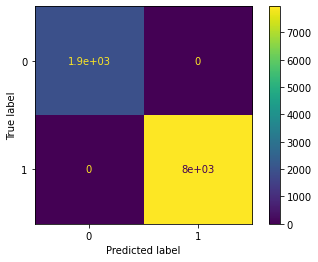

In [36]:
plot_confusion_matrix(clf, X_test, y_test)

In [37]:
import pickle

#save model
mod = MLPClassifier(solver='adam',alpha=1, max_iter=1000)

mod.fit(X_ns, y_ns)  

filename = '/content/drive/MyDrive/Underdog/NLP Project/Sprint5/Model & Data files/reputation_score_model.sav'
pickle.dump(mod, open(filename, 'wb'))

# Second Factor Reliable Source
Context Veracity: accuracy = 25.52, precision = 0.25; f1-score = 0.14 Commom linguistic: accuracy = 67.56, recall = 0.76; f1-score = 0.73 Reliabilty value of source: created by few features, no model created

## Factor: Reliable source
### 1. Context Veracity 
### 2. Commom linguistic 
### 3. Reliabilty value of source

## Data Processing and Cleaning

In [ ]:
import pandas as pd

In [ ]:
data =pd.read_csv('politifact_clean1000.csv')
data 

,author,date,statement,source,date_published,target
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",false
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",false
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",pants-fire
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",pants-fire
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",false
...,...,...,...,...,...,...
29965,Paul Specht,"April 15, 2021",On whether he supports the filibuster.,Jeff Jackson,"April 8, 2021",no-flip
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",mostly-true
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",half-true
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",true


In [ ]:
data['target'].unique()

array(['false', 'pants-fire', 'barely-true', 'mostly-true', 'half-true',
       'no-flip', 'true'], dtype=object)

In [ ]:
data.drop(data[data['target'] == 'no-flip'].index, inplace = True)
data

,author,date,statement,source,date_published,target
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",false
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",false
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",pants-fire
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",pants-fire
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",false
...,...,...,...,...,...,...
29964,Bill McCarthy,"April 15, 2021","“Maybe (the COVID-19 vaccine) doesn't work, an...",Tucker Carlson,"April 13, 2021",pants-fire
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",mostly-true
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",half-true
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",true


In [ ]:
data = data.rename(columns={"target": "truthfulness_value"})
data

,author,date,statement,source,date_published,truthfulness_value
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",false
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",false
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",pants-fire
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",pants-fire
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",false
...,...,...,...,...,...,...
29964,Bill McCarthy,"April 15, 2021","“Maybe (the COVID-19 vaccine) doesn't work, an...",Tucker Carlson,"April 13, 2021",pants-fire
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",mostly-true
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",half-true
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",true


In [ ]:
# assign each label to a number; value follow by the truthness
data.loc[(data.truthfulness_value == 'true'),'truthfulness_value']= 5
data.loc[(data.truthfulness_value == 'mostly-true'),'truthfulness_value']= 4
data.loc[(data.truthfulness_value == 'half-true'),'truthfulness_value']= 3
data.loc[(data.truthfulness_value == 'barely-true'),'truthfulness_value']= 2
data.loc[(data.truthfulness_value == 'false'),'truthfulness_value']= 1
data.loc[(data.truthfulness_value == 'pants-fire'),'truthfulness_value']= 0
data

,author,date,statement,source,date_published,truthfulness_value
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",1
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",1
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",0
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",0
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",1
...,...,...,...,...,...,...
29964,Bill McCarthy,"April 15, 2021","“Maybe (the COVID-19 vaccine) doesn't work, an...",Tucker Carlson,"April 13, 2021",0
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",4
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",3
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",5


## Find the micro- factor: Reliabilty value of source

In [ ]:
import numpy as np

In [ ]:
# check how many aritcles each author wrote
data["author"].value_counts()

Tom Kertscher            5994
Ciara O'Rourke           3996
Samantha Putterman       2997
Bill McCarthy            2997
Eric Litke               1998
Andy Nguyen              1998
Michael Majchrowicz      1998
Miriam Valverde           999
Warren Fiske              999
Clara Hendrickson         999
Lara Bonatesta            999
Kiannah Sepeda-Miller     999
Brandon Mulder            999
Louis Jacobson            999
Name: author, dtype: int64

In [ ]:
# check sum of ture_value of each author
data.groupby(['author']).sum()

,date,statement,source,date_published,truthfulness_value
author,,,,,
Andy Nguyen,"April 21, 2021April 19, 2021April 21, 2021Apri...",“Black Lives Matter and antifa set Catholic ch...,Instagram postsFacebook postsInstagram postsFa...,"April 20, 2021April 12, 2021April 20, 2021Apri...",1998
Bill McCarthy,"April 21, 2021April 19, 2021April 15, 2021Apri...",Derek Chauvin’s trial and conviction for the m...,Facebook postsFacebook postsTucker CarlsonFace...,"April 20, 2021April 6, 2021April 13, 2021April...",999
Brandon Mulder,"April 19, 2021April 19, 2021April 19, 2021Apri...",Texas “could be very close to herd immunity.”T...,Greg AbbottGreg AbbottGreg AbbottGreg AbbottGr...,"April 11, 2021April 11, 2021April 11, 2021Apri...",999
Ciara O'Rourke,"April 19, 2021April 19, 2021April 16, 2021Apri...",Hobby Lobby’s CEO wrote a letter saying the co...,Facebook postsFacebook postsViral imageViral i...,"April 15, 2021April 15, 2021April 15, 2021Apri...",4995
Clara Hendrickson,"April 16, 2021April 16, 2021April 16, 2021Apri...",Michigan used a mathematical “key” to manipula...,Douglas FrankDouglas FrankDouglas FrankDouglas...,"April 9, 2021April 9, 2021April 9, 2021April 9...",0
Eric Litke,"April 21, 2021April 16, 2021April 21, 2021Apri...",“Private insurance gives … better coverage” th...,Mark BornJanet BewleyMark BornJanet BewleyMark...,"March 21, 2021March 28, 2021March 21, 2021Marc...",2997
Kiannah Sepeda-Miller,"April 18, 2021April 18, 2021April 18, 2021Apri...",“We have 23% of all the lead pipe leads in Ame...,Richard DurbinRichard DurbinRichard DurbinRich...,"April 13, 2021April 13, 2021April 13, 2021Apri...",2997
Lara Bonatesta,"April 15, 2021April 15, 2021April 15, 2021Apri...",President Joe Biden’s American Relief Plan “ha...,Shelley Moore CapitoShelley Moore CapitoShelle...,"on March 4,on March 4,on March 4,on March 4,on...",3996
Louis Jacobson,"April 15, 2021April 15, 2021April 15, 2021Apri...",“There is racism physically built into some of...,Pete ButtigiegPete ButtigiegPete ButtigiegPete...,"April 6, 2021April 6, 2021April 6, 2021April 6...",4995


In [ ]:
# check sum of ture_value of each source
data.groupby(['source']).sum()

,author,date,statement,date_published,truthfulness_value
source,,,,,
Bloggers,Tom KertscherTom KertscherTom KertscherTom Ker...,"April 21, 2021April 21, 2021April 21, 2021Apri...",“Stanford study results” show face masks are i...,"19, 2021 in19, 2021 in19, 2021 in19, 2021 in19...",999
Diamond and Silk,Tom KertscherTom KertscherTom KertscherTom Ker...,"April 16, 2021April 16, 2021April 16, 2021Apri...",Says science shows the physiological effects o...,"on April 12,on April 12,on April 12,on April 1...",999
Douglas Frank,Clara HendricksonClara HendricksonClara Hendri...,"April 16, 2021April 16, 2021April 16, 2021Apri...",Michigan used a mathematical “key” to manipula...,"April 9, 2021April 9, 2021April 9, 2021April 9...",0
Facebook posts,Tom KertscherBill McCarthyMichael MajchrowiczS...,"April 21, 2021April 21, 2021April 21, 2021Apri...",Two photos show climate change “is a hoax.”Der...,"April 18, 2021April 20, 2021April 15, 2021Apri...",12987
George Papadopoulos,Tom KertscherTom KertscherTom KertscherTom Ker...,"April 15, 2021April 15, 2021April 15, 2021Apri...",Says Joe Biden is “withholding $150 million in...,"April 12, 2021April 12, 2021April 12, 2021Apri...",999
Greg Abbott,Brandon MulderBrandon MulderBrandon MulderBran...,"April 19, 2021April 19, 2021April 19, 2021Apri...",Texas “could be very close to herd immunity.”T...,"April 11, 2021April 11, 2021April 11, 2021Apri...",999
Instagram posts,Andy NguyenAndy NguyenAndy NguyenAndy NguyenAn...,"April 21, 2021April 21, 2021April 21, 2021Apri...",“Black Lives Matter and antifa set Catholic ch...,"April 20, 2021April 20, 2021April 20, 2021Apri...",999
Janet Bewley,Eric LitkeEric LitkeEric LitkeEric LitkeEric L...,"April 16, 2021April 16, 2021April 16, 2021Apri...",Says Republican lawmakers delayed COVID-19 tes...,"March 28, 2021March 28, 2021March 28, 2021Marc...",1998
Mark Born,Eric LitkeEric LitkeEric LitkeEric LitkeEric L...,"April 21, 2021April 21, 2021April 21, 2021Apri...",“Private insurance gives … better coverage” th...,"March 21, 2021March 21, 2021March 21, 2021Marc...",999


In [ ]:
data['average_of_true_value(author)'] = 0

In [ ]:
# the average ture value of each author = (sum of ture_value) / (count all articles created by that author)
data.loc[(data.author == 'Andy Nguyen'),'average_of_true_value(author)']= 1998/1998
data.loc[(data.author == 'Bill McCarthy'),'average_of_true_value(author)']= 999/2997
data.loc[(data.author == 'Brandon Mulder'),'average_of_true_value(author)']= 999/999
data.loc[(data.author == "Ciara O'Rourke"),'average_of_true_value(author)']= 4995/3996
data.loc[(data.author == 'Clara Hendrickson'),'average_of_true_value(author)']= 0
data.loc[(data.author == 'Eric Litke'),'average_of_true_value(author)']= 2997/1998
data.loc[(data.author == 'Kiannah Sepeda-Miller'),'average_of_true_value(author)']= 2997/999
data.loc[(data.author == 'Lara Bonatesta'),'average_of_true_value(author)']= 3996/999
data.loc[(data.author == 'Louis Jacobson'),'average_of_true_value(author)']= 4995/999
data.loc[(data.author == 'Michael Majchrowicz'),'average_of_true_value(author)']= 999/1998
data.loc[(data.author == 'Miriam Valverde'),'average_of_true_value(author)']= 999/999
data.loc[(data.author == 'Samantha Putterman'),'average_of_true_value(author)']= 0
data.loc[(data.author == 'Tom Kertscher'),'average_of_true_value(author)']= 8991/5994
data.loc[(data.author == 'Warren Fiske'),'average_of_true_value(author)']= 3996/999
data

,author,date,statement,source,date_published,truthfulness_value,average_of_true_value(author)
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",1,1.500000
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",1,1.000000
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",0,0.000000
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",0,0.333333
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",1,0.500000
...,...,...,...,...,...,...,...
29964,Bill McCarthy,"April 15, 2021","“Maybe (the COVID-19 vaccine) doesn't work, an...",Tucker Carlson,"April 13, 2021",0,0.333333
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",4,4.000000
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",3,1.500000
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",5,5.000000


In [ ]:
data["source"].value_counts()

Facebook posts          12987
Viral image              2997
Bloggers                  999
George Papadopoulos       999
Janet Bewley              999
Mark Born                 999
Terry McAuliffe           999
Tucker Carlson            999
Diamond and Silk          999
Richard Durbin            999
Greg Abbott               999
Shelley Moore Capito      999
Pete Buttigieg            999
Instagram posts           999
Douglas Frank             999
Name: source, dtype: int64

In [ ]:
data['average_of_true_value(source)'] = 0

In [ ]:
# the average ture value of each source = (sum of ture_value) / (count all articles published by that source)
data.loc[(data.source == 'Facebook posts'),'average_of_true_value(source)']= 12987/12987
data.loc[(data.source == 'Viral image'),'average_of_true_value(source)']= 1998/2997
data.loc[(data.source == 'Bloggers'),'average_of_true_value(source)']= 999/999
data.loc[(data.source == "Mark Born"),'average_of_true_value(source)']= 999/999
data.loc[(data.source == 'Douglas Frank'),'average_of_true_value(source)']= 0
data.loc[(data.source == 'Greg Abbott'),'average_of_true_value(source)']= 999/999
data.loc[(data.source == 'Richard Durbin'),'average_of_true_value(source)']= 2997/999
data.loc[(data.source == 'Janet Bewley'),'average_of_true_value(source)']= 1998/999
data.loc[(data.source == 'Diamond and Silk'),'average_of_true_value(source)']= 999/999
data.loc[(data.source == 'Terry McAuliffe'),'average_of_true_value(source)']= 999/999
data.loc[(data.source == 'Tucker Carlson'),'average_of_true_value(source)']= 0
data.loc[(data.source == 'Instagram posts'),'average_of_true_value(source)']= 999/999
data.loc[(data.source == 'Shelley Moore Capito'),'average_of_true_value(source)']= 3996/999
data.loc[(data.source == 'Pete Buttigieg'),'average_of_true_value(source)']= 4995/999
data.loc[(data.source == 'George Papadopoulos'),'average_of_true_value(source)']= 999/999
data

,author,date,statement,source,date_published,truthfulness_value,average_of_true_value(author),average_of_true_value(source)
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",1,1.500000,1.000000
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",1,1.000000,1.000000
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",0,0.000000,0.666667
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",0,0.333333,1.000000
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",1,0.500000,1.000000
...,...,...,...,...,...,...,...,...
29964,Bill McCarthy,"April 15, 2021","“Maybe (the COVID-19 vaccine) doesn't work, an...",Tucker Carlson,"April 13, 2021",0,0.333333,0.000000
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",4,4.000000,4.000000
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",3,1.500000,1.000000
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",5,5.000000,5.000000


In [ ]:
data['reliabilty_value_of_source'] = data['average_of_true_value(author)'] * data['average_of_true_value(source)']
data

,author,date,statement,source,date_published,truthfulness_value,average_of_true_value(author),average_of_true_value(source),reliabilty_value_of_source
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",1,1.500000,1.000000,1.500000
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",1,1.000000,1.000000,1.000000
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",0,0.000000,0.666667,0.000000
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",0,0.333333,1.000000,0.333333
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",1,0.500000,1.000000,0.500000
...,...,...,...,...,...,...,...,...,...
29964,Bill McCarthy,"April 15, 2021","“Maybe (the COVID-19 vaccine) doesn't work, an...",Tucker Carlson,"April 13, 2021",0,0.333333,0.000000,0.000000
29966,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",4,4.000000,4.000000,16.000000
29967,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",3,1.500000,1.000000,1.500000
29968,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",5,5.000000,5.000000,25.000000


In [ ]:
# save the dataframe to csv file
#data.to_csv('micro1.csv', index=False)

In [ ]:
data =pd.read_csv('micro1.csv')
data

,author,date,statement,source,date_published,truthfulness_value,average_of_true_value(author),average_of_true_value(source),reliabilty_value_of_source
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",1,1.500000,1.000000,1.500000
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",1,1.000000,1.000000,1.000000
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",0,0.000000,0.666667,0.000000
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",0,0.333333,1.000000,0.333333
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",1,0.500000,1.000000,0.500000
...,...,...,...,...,...,...,...,...,...
28966,Bill McCarthy,"April 15, 2021","“Maybe (the COVID-19 vaccine) doesn't work, an...",Tucker Carlson,"April 13, 2021",0,0.333333,0.000000,0.000000
28967,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",4,4.000000,4.000000,16.000000
28968,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",3,1.500000,1.000000,1.500000
28969,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",5,5.000000,5.000000,25.000000


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28971 entries, 0 to 28970
Data columns (total 9 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   author                         28971 non-null  object 
 1   date                           28971 non-null  object 
 2   statement                      28971 non-null  object 
 3   source                         28971 non-null  object 
 4   date_published                 28971 non-null  object 
 5   truthfulness_value             28971 non-null  int64  
 6   average_of_true_value(author)  28971 non-null  float64
 7   average_of_true_value(source)  28971 non-null  float64
 8   reliabilty_value_of_source     28971 non-null  float64
dtypes: float64(3), int64(1), object(5)
memory usage: 2.0+ MB


In [ ]:
# For Muller Loop Regression
import time
from sklearn import metrics
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor

In [ ]:
names = ["Nearest Neighbors", "Linear SVR", "Gaussian Process",
         "Decision Tree", "Random Forest", "MLP", "AdaBoost"
         ]

In [ ]:
X = data[['truthfulness_value']]
y = data['reliabilty_value_of_source']

In [ ]:
regression = [
    KNeighborsRegressor(2),
    SVR(kernel='rbf', degree=3, gamma='scale', coef0=0.0, tol=0.001, C=1.0, epsilon=0.1, shrinking=True, cache_size=200, verbose=False, max_iter=- 1),
    GaussianProcessRegressor(kernel=None, alpha=1e-10, optimizer='fmin_l_bfgs_b', n_restarts_optimizer=0, normalize_y=False, copy_X_train=True, random_state=None),
    DecisionTreeRegressor(criterion='mse', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, ccp_alpha=0.0),
    RandomForestRegressor(max_depth=5, n_estimators=10, max_features=1),
    MLPRegressor(alpha=1, max_iter=1500),
    AdaBoostRegressor(base_estimator=None, n_estimators=50, learning_rate=1.0, loss='linear', random_state=None)
    ]
reg_output = pd.DataFrame(columns=['regressor','mae', 'mse', 'Rsquared', 'accuracy', 'Training time'])

In [ ]:
# Train the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

In [ ]:
max_score = 0.0
max_class = ''
# iterate over regressor
for name, clf in zip(names, regression):
    start_time = time.process_time()
    time_finish = time.process_time() - start_time
    clf.fit(X_train, y_train)
  
    score = 100.0 * clf.score(X_test, y_test)
    y_predict = clf.predict(X_test)

    
    mae = np.round(metrics.mean_absolute_error(y_test, y_predict), 2)
    mse = np.round(metrics.mean_squared_error(y_test, y_predict), 2)
    rsquared = np.round(metrics.r2_score(y_test, y_predict), 2)
    reg_output = reg_output.append({'regressor': name, 'mae':mae, 'mse':mse,'Rsquared':rsquared, 'accuracy':score, 'Training time':time_finish}, ignore_index=True)

    # print("MSE : " , np.round(metrics.mean_squared_error(y_test, y_pred), 2))
    # print("MAE : " , np.round(metrics.mean_absolute_error(y_test, y_pred), 2))
    # print("RSquared : " , np.round(metrics.r2_score(y_test, y_pred), 2))
    # print('Regression = %s, Score (accuracy) = %.2f,' %(name, score), 'Training time = %.2f seconds,'%(time.process_time() - start_time))
    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name
print(80*'-' )
print('Best --> Regression = %s, Score (accuracy) = %.2f' %(max_class, max_score),'Training time = %.2f seconds,'%(time.process_time() - start_time))

--------------------------------------------------------------------------------
Best --> Regression = MLP, Score (accuracy) = 88.31 Training time = 0.11 seconds,


In [ ]:
# Save the pickle file
import pickle 
mlp_model = MLPRegressor(alpha=1, max_iter=2000)
mlp_model.fit(X, y)
filename = 'reliabilty_model.sav'
pickle.dump(mlp_model, open(filename, 'wb'))

## Find the micro factor: Context Veracity

This step is mainly focus on the context with truthfulness value. 

In [ ]:
data =pd.read_csv('politifact.csv')
data

,author_date,statments,fact_checks
0,"By Amy Sherman • April 30, 2021",Says Democrats blocked his efforts at police r...,mostly-true
1,"By Gabrielle Settles • April 29, 2021",60% of new COVID-19 patients are people who re...,pants-fire
2,"By Bill McCarthy • April 29, 2021",Says Joe Biden is “going to control how much m...,pants-fire
3,"By Louis Jacobson • April 27, 2021",“Biden is currently sending more military equi...,false
4,"By Amy Sherman • April 27, 2021",Says his administration’s efforts have led to ...,half-true
...,...,...,...
2635,"By Steve Contorno • January 19, 2014","In Russia ""all people are absolutely equal reg...",half-true
2636,"By Louis Jacobson • January 17, 2014","""In 1916, the U.S. government predicted that b...",false
2637,"By Julie Kliegman • January 17, 2014","""For the first time in nearly two decades, we ...",true
2638,"By Steve Contorno • January 16, 2014","On foreign policy, Joe Biden was against aid f...",mostly-true


In [ ]:
data = data.rename(columns={"fact_checks": "truthfulness_value"})
data

,author_date,statments,truthfulness_value
0,"By Amy Sherman • April 30, 2021",Says Democrats blocked his efforts at police r...,mostly-true
1,"By Gabrielle Settles • April 29, 2021",60% of new COVID-19 patients are people who re...,pants-fire
2,"By Bill McCarthy • April 29, 2021",Says Joe Biden is “going to control how much m...,pants-fire
3,"By Louis Jacobson • April 27, 2021",“Biden is currently sending more military equi...,false
4,"By Amy Sherman • April 27, 2021",Says his administration’s efforts have led to ...,half-true
...,...,...,...
2635,"By Steve Contorno • January 19, 2014","In Russia ""all people are absolutely equal reg...",half-true
2636,"By Louis Jacobson • January 17, 2014","""In 1916, the U.S. government predicted that b...",false
2637,"By Julie Kliegman • January 17, 2014","""For the first time in nearly two decades, we ...",true
2638,"By Steve Contorno • January 16, 2014","On foreign policy, Joe Biden was against aid f...",mostly-true


In [ ]:
data['truthfulness_value'].unique()

array(['mostly-true', 'pants-fire', 'false', 'half-true', 'barely-true',
       'true', 'full-flop', 'no-flip'], dtype=object)

In [ ]:
data.drop(data[data['truthfulness_value'] == 'no-flip'].index, inplace = True)
data.drop(data[data['truthfulness_value'] == 'full-flop'].index, inplace = True)
data

,author_date,statments,truthfulness_value
0,"By Amy Sherman • April 30, 2021",Says Democrats blocked his efforts at police r...,mostly-true
1,"By Gabrielle Settles • April 29, 2021",60% of new COVID-19 patients are people who re...,pants-fire
2,"By Bill McCarthy • April 29, 2021",Says Joe Biden is “going to control how much m...,pants-fire
3,"By Louis Jacobson • April 27, 2021",“Biden is currently sending more military equi...,false
4,"By Amy Sherman • April 27, 2021",Says his administration’s efforts have led to ...,half-true
...,...,...,...
2635,"By Steve Contorno • January 19, 2014","In Russia ""all people are absolutely equal reg...",half-true
2636,"By Louis Jacobson • January 17, 2014","""In 1916, the U.S. government predicted that b...",false
2637,"By Julie Kliegman • January 17, 2014","""For the first time in nearly two decades, we ...",true
2638,"By Steve Contorno • January 16, 2014","On foreign policy, Joe Biden was against aid f...",mostly-true


In [ ]:
# assign each label to a number; value follow by the truthness
data.loc[(data.truthfulness_value == 'true'),'truthfulness_value']= 5
data.loc[(data.truthfulness_value == 'mostly-true'),'truthfulness_value']= 4
data.loc[(data.truthfulness_value == 'half-true'),'truthfulness_value']= 3
data.loc[(data.truthfulness_value == 'barely-true'),'truthfulness_value']= 2
data.loc[(data.truthfulness_value == 'false'),'truthfulness_value']= 1
data.loc[(data.truthfulness_value == 'pants-fire'),'truthfulness_value']= 0
data

,author_date,statments,truthfulness_value
0,"By Amy Sherman • April 30, 2021",Says Democrats blocked his efforts at police r...,4
1,"By Gabrielle Settles • April 29, 2021",60% of new COVID-19 patients are people who re...,0
2,"By Bill McCarthy • April 29, 2021",Says Joe Biden is “going to control how much m...,0
3,"By Louis Jacobson • April 27, 2021",“Biden is currently sending more military equi...,1
4,"By Amy Sherman • April 27, 2021",Says his administration’s efforts have led to ...,3
...,...,...,...
2635,"By Steve Contorno • January 19, 2014","In Russia ""all people are absolutely equal reg...",3
2636,"By Louis Jacobson • January 17, 2014","""In 1916, the U.S. government predicted that b...",1
2637,"By Julie Kliegman • January 17, 2014","""For the first time in nearly two decades, we ...",5
2638,"By Steve Contorno • January 16, 2014","On foreign policy, Joe Biden was against aid f...",4


In [ ]:
df=data.copy()
df.reset_index(inplace=True)
df.head(5)

,index,author_date,statments,truthfulness_value
0,0,"By Amy Sherman • April 30, 2021",Says Democrats blocked his efforts at police r...,4
1,1,"By Gabrielle Settles • April 29, 2021",60% of new COVID-19 patients are people who re...,0
2,2,"By Bill McCarthy • April 29, 2021",Says Joe Biden is “going to control how much m...,0
3,3,"By Louis Jacobson • April 27, 2021",“Biden is currently sending more military equi...,1
4,4,"By Amy Sherman • April 27, 2021",Says his administration’s efforts have led to ...,3


In [ ]:
import re

In [ ]:
# extract author from the feature
author = []
for i in df['author_date']:
    author.append(i.split()[1:3])
    
    
df['author'] = author
df.head()

,index,author_date,statments,truthfulness_value,author
0,0,"By Amy Sherman • April 30, 2021",Says Democrats blocked his efforts at police r...,4,"[Amy, Sherman]"
1,1,"By Gabrielle Settles • April 29, 2021",60% of new COVID-19 patients are people who re...,0,"[Gabrielle, Settles]"
2,2,"By Bill McCarthy • April 29, 2021",Says Joe Biden is “going to control how much m...,0,"[Bill, McCarthy]"
3,3,"By Louis Jacobson • April 27, 2021",“Biden is currently sending more military equi...,1,"[Louis, Jacobson]"
4,4,"By Amy Sherman • April 27, 2021",Says his administration’s efforts have led to ...,3,"[Amy, Sherman]"


In [ ]:
df['author'] = df['author'].astype(str).str.replace(r"\[|\]|'", '')
df.head()

,index,author_date,statments,truthfulness_value,author
0,0,"By Amy Sherman • April 30, 2021",Says Democrats blocked his efforts at police r...,4,"Amy, Sherman"
1,1,"By Gabrielle Settles • April 29, 2021",60% of new COVID-19 patients are people who re...,0,"Gabrielle, Settles"
2,2,"By Bill McCarthy • April 29, 2021",Says Joe Biden is “going to control how much m...,0,"Bill, McCarthy"
3,3,"By Louis Jacobson • April 27, 2021",“Biden is currently sending more military equi...,1,"Louis, Jacobson"
4,4,"By Amy Sherman • April 27, 2021",Says his administration’s efforts have led to ...,3,"Amy, Sherman"


### Apply Lemmatization and Stopwords

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.stem import WordNetLemmatizer

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
import re
lemmatizer = WordNetLemmatizer()
corpus = []

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ray\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ray\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
for i in range(0, len(df)):
    review = re.sub('[^a-zA-Z0-9]', ' ', df['statments'][i])
    review = review.lower()
    review = review.split()
    
    review = [lemmatizer.lemmatize(word) for word in review if not word in stopwords.words('english')]
    review = ' '.join(review)
    corpus.append(review)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2622 entries, 0 to 2621
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   index               2622 non-null   int64 
 1   author_date         2622 non-null   object
 2   statments           2622 non-null   object
 3   truthfulness_value  2622 non-null   object
 4   author              2622 non-null   object
dtypes: int64(1), object(4)
memory usage: 102.5+ KB


In [ ]:
len(corpus)

2622

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

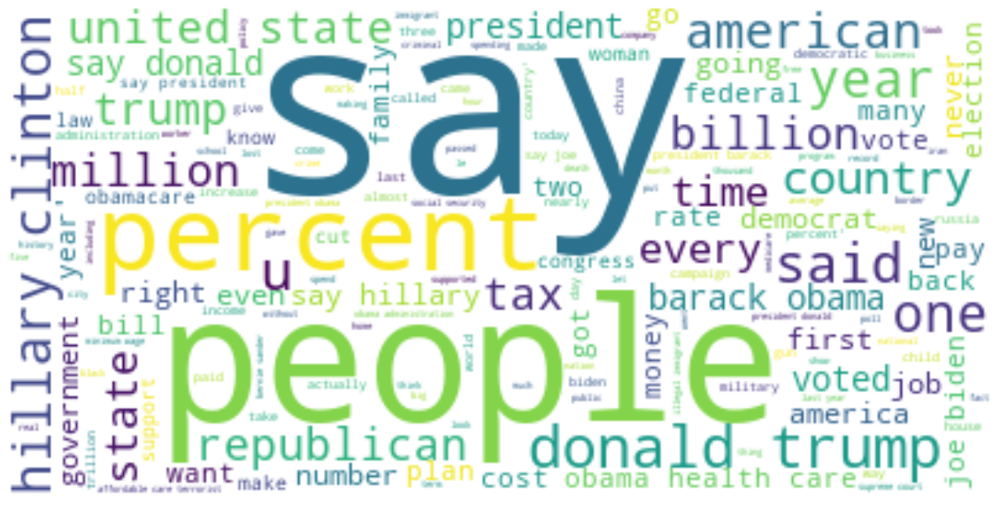

In [ ]:
wordcloud_ = WordCloud(background_color="white").generate(str(corpus))

# Lines 2 - 5
plt.figure(figsize = (20,20))
plt.imshow(wordcloud_, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
#df['truthfulness_value'].astype('category')
df['truthfulness_value'] = df['truthfulness_value'].astype(str)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2622 entries, 0 to 2621
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   index               2622 non-null   int64 
 1   author_date         2622 non-null   object
 2   statments           2622 non-null   object
 3   truthfulness_value  2622 non-null   object
dtypes: int64(1), object(3)
memory usage: 82.1+ KB


### Apply TF-IDF

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_v = TfidfVectorizer(max_features=5000, ngram_range=(1,3))
X = tfidf_v.fit_transform(corpus).toarray()

In [ ]:
y = df['truthfulness_value']
y = y.astype('int')

In [ ]:
## Divide the dataset into Train and Test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=0)

In [ ]:
X_train.shape

(1756, 5000)

Hint: y axis -3000 is the dimension/features of vectors.

### Classification

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn import metrics
import numpy as np
import itertools

In [ ]:
import time

# names = ["Decision Tree", "MLP Neural Net"]
names = ["Gaussian Naive Bayes","Decision Tree", "MLP Neural Net", "RandomForestClassifier", "GradientBoostingClassifier"]

classifiers = [
    GaussianNB(var_smoothing=1e-09),
    DecisionTreeClassifier(max_depth=5),
    MLPClassifier(solver='adam',alpha=1, max_iter=1000),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    GradientBoostingClassifier(loss='deviance', learning_rate=0.1, n_estimators=100)
    ]
output = pd.DataFrame(columns=['classifier','f1-score', 'precision', 'recall', 'accuracy'])

max_score = 0.0
max_class = ''
# iterate over classifiers

for name, clf in zip(names, classifiers):

    start_time = time.process_time()
    clf.fit(X_train, y_train)
    y_predict = clf.predict(X_test)

    score = 100.0 * clf.score(X_test, y_test)

    # score = metrics.accuracy_score(y_test, y_predict)
    
    precision = np.round(metrics.precision_score(y_test, y_predict, average='macro'),2)
    recall = np.round(metrics.recall_score(y_test, y_predict, average='macro'),2)
    f1 = np.round(metrics.f1_score(y_test, y_predict, average='macro'),2)

    output = output.append({'classifier': name,'f1-score':f1, 'precision':precision,'recall':recall,'accuracy':score}, ignore_index=True)

    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name

print(80*'-' )
print('Best --> Classifier = %s, Score (test, accuracy) = %.2f' %(max_class, max_score))
display(output)

--------------------------------------------------------------------------------
Best --> Classifier = MLP Neural Net, Score (test, accuracy) = 25.17


,classifier,f1-score,precision,recall,accuracy
0,Gaussian Naive Bayes,0.23,0.23,0.23,23.672055
1,Decision Tree,0.10,0.17,0.17,24.480370
2,MLP Neural Net,0.20,0.24,0.21,25.173210
3,RandomForestClassifier,0.08,0.20,0.17,24.480370
4,GradientBoostingClassifier,0.19,0.22,0.20,24.480370


### Svae model

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt  
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_roc_curve
from sklearn.pipeline import make_pipeline

In [ ]:
# X = df['statments']
y = df['truthfulness_value']
y = y.astype('int')
y

0       4
1       0
2       0
3       1
4       3
       ..
2617    3
2618    1
2619    5
2620    4
2621    5
Name: truthfulness_value, Length: 2622, dtype: int32

In [ ]:
import pickle

#save model
mod = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', GradientBoostingClassifier(loss='deviance', learning_rate=0.1, n_estimators=100)),
               ])

mod.fit(corpus, y)  

filename = 'factor2_model.sav'
pickle.dump(mod, open(filename, 'wb'))

### Confusion matrix and Visualization

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    See full source and example: 
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [ ]:
y_pred = clf_best.predict(X_test)

Accuracy:   0.255
Confusion matrix, without normalization


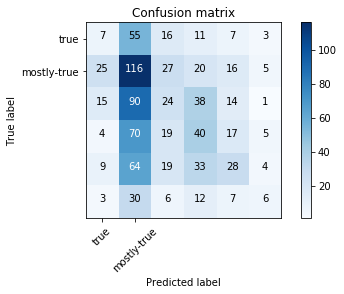

In [ ]:
score = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm, classes=['true', 'mostly-true'])

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.11      0.07      0.09        99
           1       0.27      0.56      0.37       209
           2       0.22      0.13      0.16       182
           3       0.26      0.26      0.26       155
           4       0.31      0.18      0.23       157
           5       0.25      0.09      0.14        64

    accuracy                           0.26       866
   macro avg       0.24      0.21      0.21       866
weighted avg       0.25      0.26      0.23       866



### Load dataset from Kaggle

dataset: https://www.kaggle.com/anthonyc1/fake-news-classifier-final-project/comments?select=news_dataset.csv

In [ ]:
data2 =pd.read_csv('news_dataset.csv')
data2

,Unnamed: 0,title,content,publication,label
0,0,Muslims BUSTED: They Stole Millions In Gov’t B...,Print They should pay all the back all the mon...,100percentfedup,fake
1,1,Re: Why Did Attorney General Loretta Lynch Ple...,Why Did Attorney General Loretta Lynch Plead T...,100percentfedup,fake
2,2,BREAKING: Weiner Cooperating With FBI On Hilla...,Red State : \nFox News Sunday reported this mo...,100percentfedup,fake
3,3,PIN DROP SPEECH BY FATHER OF DAUGHTER Kidnappe...,Email Kayla Mueller was a prisoner and torture...,100percentfedup,fake
4,4,FANTASTIC! TRUMP'S 7 POINT PLAN To Reform Heal...,Email HEALTHCARE REFORM TO MAKE AMERICA GREAT ...,100percentfedup,fake
...,...,...,...,...,...
28706,15707,An eavesdropping Uber driver saved his 16-year...,Uber driver Keith Avila picked up a p...,Washington Post,real
28707,15708,Plane carrying six people returning from a Cav...,Crews on Friday continued to search L...,Washington Post,real
28708,15709,After helping a fraction of homeowners expecte...,When the Obama administration announced a...,Washington Post,real
28709,15710,"Yes, this is real: Michigan just banned bannin...",This story has been updated. A new law in...,Washington Post,real


In [ ]:
# label encoding the data
from sklearn.preprocessing import LabelEncoder
  
le = LabelEncoder()
data2['fake_or_real']= le.fit_transform(data2['label'])
data2 = data2.drop(['label'], axis=1)
data2.head(5)

,Unnamed: 0,title,content,publication,fake_or_real
0,0,Muslims BUSTED: They Stole Millions In Gov’t B...,Print They should pay all the back all the mon...,100percentfedup,0
1,1,Re: Why Did Attorney General Loretta Lynch Ple...,Why Did Attorney General Loretta Lynch Plead T...,100percentfedup,0
2,2,BREAKING: Weiner Cooperating With FBI On Hilla...,Red State : \nFox News Sunday reported this mo...,100percentfedup,0
3,3,PIN DROP SPEECH BY FATHER OF DAUGHTER Kidnappe...,Email Kayla Mueller was a prisoner and torture...,100percentfedup,0
4,4,FANTASTIC! TRUMP'S 7 POINT PLAN To Reform Heal...,Email HEALTHCARE REFORM TO MAKE AMERICA GREAT ...,100percentfedup,0


    0: fake news; 1: real news

In [ ]:
# remove the rows with NaN
df2 = data2.dropna()
df2

,Unnamed: 0,title,content,publication,fake_or_real
0,0,Muslims BUSTED: They Stole Millions In Gov’t B...,Print They should pay all the back all the mon...,100percentfedup,0
1,1,Re: Why Did Attorney General Loretta Lynch Ple...,Why Did Attorney General Loretta Lynch Plead T...,100percentfedup,0
2,2,BREAKING: Weiner Cooperating With FBI On Hilla...,Red State : \nFox News Sunday reported this mo...,100percentfedup,0
3,3,PIN DROP SPEECH BY FATHER OF DAUGHTER Kidnappe...,Email Kayla Mueller was a prisoner and torture...,100percentfedup,0
4,4,FANTASTIC! TRUMP'S 7 POINT PLAN To Reform Heal...,Email HEALTHCARE REFORM TO MAKE AMERICA GREAT ...,100percentfedup,0
...,...,...,...,...,...
28706,15707,An eavesdropping Uber driver saved his 16-year...,Uber driver Keith Avila picked up a p...,Washington Post,1
28707,15708,Plane carrying six people returning from a Cav...,Crews on Friday continued to search L...,Washington Post,1
28708,15709,After helping a fraction of homeowners expecte...,When the Obama administration announced a...,Washington Post,1
28709,15710,"Yes, this is real: Michigan just banned bannin...",This story has been updated. A new law in...,Washington Post,1


## Micro-factor: Commom linguistic

Find the sentence structure of fake and real news.

In [ ]:
import spacy
from spacy import displacy
spacy.__version__

'3.0.6'

In [ ]:
# Download spacy models
#!python -m spacy download en_core_web_sm

In [ ]:
# load Spacy model
nlp = spacy.load("en_core_web_sm")

In [ ]:
token_list = []
for doc in df2['title']:   
    token_list.append(nlp(doc))

token_list[0]

Muslims BUSTED: They Stole Millions In Gov’t Benefits

In [ ]:
tags = []
tag_list = []

for token in token_list:
    for i in token: 
        tags.append(i.pos_)
    tag_list.append(tags)
    tags = []

    
len(tag_list)

27985

In [ ]:
df2['sentence_struc'] = tag_list
df2

<ipython-input-12-cdbc1da74b97>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['sentence_struc'] = tag_list


,Unnamed: 0,title,content,publication,fake_or_real,sentence_struc
0,0,Muslims BUSTED: They Stole Millions In Gov’t B...,Print They should pay all the back all the mon...,100percentfedup,0,"[NOUN, ADJ, PUNCT, PRON, VERB, PROPN, ADP, PRO..."
1,1,Re: Why Did Attorney General Loretta Lynch Ple...,Why Did Attorney General Loretta Lynch Plead T...,100percentfedup,0,"[ADP, PUNCT, ADV, VERB, PROPN, PROPN, PROPN, P..."
2,2,BREAKING: Weiner Cooperating With FBI On Hilla...,Red State : \nFox News Sunday reported this mo...,100percentfedup,0,"[VERB, PUNCT, PROPN, VERB, ADP, PROPN, ADP, PR..."
3,3,PIN DROP SPEECH BY FATHER OF DAUGHTER Kidnappe...,Email Kayla Mueller was a prisoner and torture...,100percentfedup,0,"[NOUN, NOUN, VERB, ADP, PROPN, ADP, NOUN, PROP..."
4,4,FANTASTIC! TRUMP'S 7 POINT PLAN To Reform Heal...,Email HEALTHCARE REFORM TO MAKE AMERICA GREAT ...,100percentfedup,0,"[PROPN, PUNCT, PROPN, PART, NUM, ADJ, NOUN, AD..."
...,...,...,...,...,...,...
28706,15707,An eavesdropping Uber driver saved his 16-year...,Uber driver Keith Avila picked up a p...,Washington Post,1,"[DET, NOUN, PROPN, NOUN, VERB, PRON, NUM, PUNC..."
28707,15708,Plane carrying six people returning from a Cav...,Crews on Friday continued to search L...,Washington Post,1,"[NOUN, VERB, NUM, NOUN, VERB, ADP, DET, PROPN,..."
28708,15709,After helping a fraction of homeowners expecte...,When the Obama administration announced a...,Washington Post,1,"[ADP, VERB, DET, NOUN, ADP, NOUN, VERB, PUNCT,..."
28709,15710,"Yes, this is real: Michigan just banned bannin...",This story has been updated. A new law in...,Washington Post,1,"[INTJ, PUNCT, DET, AUX, ADJ, PUNCT, PROPN, ADV..."


In [ ]:
df2['sentence_struc'] = df2['sentence_struc'].astype(str).str.replace(r"\[|\]|'", '')
df2.head()

<ipython-input-13-95274d7e456b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['sentence_struc'] = df2['sentence_struc'].astype(str).str.replace(r"\[|\]|'", '')


,Unnamed: 0,title,content,publication,fake_or_real,sentence_struc
0,0,Muslims BUSTED: They Stole Millions In Gov’t B...,Print They should pay all the back all the mon...,100percentfedup,0,"NOUN, ADJ, PUNCT, PRON, VERB, PROPN, ADP, PROP..."
1,1,Re: Why Did Attorney General Loretta Lynch Ple...,Why Did Attorney General Loretta Lynch Plead T...,100percentfedup,0,"ADP, PUNCT, ADV, VERB, PROPN, PROPN, PROPN, PR..."
2,2,BREAKING: Weiner Cooperating With FBI On Hilla...,Red State : \nFox News Sunday reported this mo...,100percentfedup,0,"VERB, PUNCT, PROPN, VERB, ADP, PROPN, ADP, PRO..."
3,3,PIN DROP SPEECH BY FATHER OF DAUGHTER Kidnappe...,Email Kayla Mueller was a prisoner and torture...,100percentfedup,0,"NOUN, NOUN, VERB, ADP, PROPN, ADP, NOUN, PROPN..."
4,4,FANTASTIC! TRUMP'S 7 POINT PLAN To Reform Heal...,Email HEALTHCARE REFORM TO MAKE AMERICA GREAT ...,100percentfedup,0,"PROPN, PUNCT, PROPN, PART, NUM, ADJ, NOUN, ADP..."


We have sentence structure of the context; fake articles and real articles might or might not have different sentence structures. Based on that, I perfrom classification based on sentences structure.

### Convert words to number 

In [ ]:
X = df2['sentence_struc'].values
X

array(['NOUN, ADJ, PUNCT, PRON, VERB, PROPN, ADP, PROPN, NOUN',
       'ADP, PUNCT, ADV, VERB, PROPN, PROPN, PROPN, PROPN, PROPN, DET, PROPN, PUNCT',
       'VERB, PUNCT, PROPN, VERB, ADP, PROPN, ADP, PROPN, PROPN, PROPN',
       ...,
       'ADP, VERB, DET, NOUN, ADP, NOUN, VERB, PUNCT, PROPN, PART, NOUN, NOUN, NOUN, AUX, ADV, VERB',
       'INTJ, PUNCT, DET, AUX, ADJ, PUNCT, PROPN, ADV, VERB, VERB, NOUN, NOUN',
       'PRON, VERB, ADP, PROPN, NOUN, ADP, NOUN, VERB, ADJ, NOUN'],
      dtype=object)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(max_features = 10)
X = cv.fit_transform(X).toarray()

In [ ]:
X

array([[1, 1, 0, ..., 2, 1, 1],
       [0, 1, 0, ..., 6, 2, 1],
       [0, 2, 0, ..., 5, 1, 2],
       ...,
       [0, 2, 1, ..., 1, 1, 3],
       [1, 0, 1, ..., 1, 2, 2],
       [1, 2, 0, ..., 1, 0, 2]], dtype=int64)

In [ ]:
y = df2['fake_or_real'].values
y

array([0, 0, 0, ..., 1, 1, 1])

### Classification based on sentence structure

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

In [ ]:
## Divide the dataset into Train and Test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=0)

In [ ]:
names = ["Nearest Neighbors", "Linear SVM", 
         #"RBF SVM", 
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost", 
         "Naive Bayes"]
         

classifiers = [
    KNeighborsClassifier(2),
    SVC(kernel="linear", C=0.025),
    #SVC(gamma=2, C=1),
    # GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB()
]

In [ ]:
from datetime import datetime
from datetime import date
import time
max_score = 0.0
max_class = ''
results =[]
accuracies = []
txtval = ''
map = {}
# iterate over classifiers
for name, clf in zip(names, classifiers):
    start_time = datetime.now()
    clf.fit(X_train, np.ravel(y_train))
    score = 100.0 * clf.score(X_test, y_test)
    nm=name+'='
    #txtvl = str(score)
    #accuracies.append(nm+txtvl)
    map.__setitem__(name,score)
    delta_time = datetime.now() - start_time
    results.append(clf.score(X_test, y_test))
    print('Classifier = %s, Score (test, accuracy) = %.2f,' %(name, score), 'Training time = %.2f seconds,' %(delta_time.total_seconds()))
    
    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name

print(80*'-' )
print('Best --> Classifier = %s, Score (test, accuracy) = %.2f' %(max_class, max_score))

Classifier = Nearest Neighbors, Score (test, accuracy) = 59.89, Training time = 2.38 seconds,
Classifier = Linear SVM, Score (test, accuracy) = 63.80, Training time = 35.29 seconds,
Classifier = Decision Tree, Score (test, accuracy) = 65.16, Training time = 0.03 seconds,
Classifier = Random Forest, Score (test, accuracy) = 63.34, Training time = 0.13 seconds,
Classifier = Neural Net, Score (test, accuracy) = 67.96, Training time = 10.56 seconds,
Classifier = AdaBoost, Score (test, accuracy) = 64.06, Training time = 1.02 seconds,
Classifier = Naive Bayes, Score (test, accuracy) = 59.58, Training time = 0.03 seconds,
--------------------------------------------------------------------------------
Best --> Classifier = Neural Net, Score (test, accuracy) = 67.96


In [ ]:
y_pred = clf_best.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.68      0.50      0.58      4028
           1       0.68      0.82      0.74      5208

    accuracy                           0.68      9236
   macro avg       0.68      0.66      0.66      9236
weighted avg       0.68      0.68      0.67      9236



#### Save the model

In [ ]:
import pickle

In [ ]:
mlp_model = MLPClassifier(alpha=1, max_iter=1000)
mlp_model.fit(X, y)

MLPClassifier(alpha=1, max_iter=1000)

In [ ]:
with open('factor3_model', 'wb') as f:
    pickle.dump(mlp_model, f)

## Combine all micro-factors

In [ ]:
data =pd.read_csv('micro1.csv')
data

,author,date,statement,source,date_published,truthfulness_value,average_of_true_value(author),average_of_true_value(source),reliabilty_value_of_source
0,Tom Kertscher,"April 21, 2021",Two photos show climate change “is a hoax.”,Facebook posts,"April 18, 2021",1,1.500000,1.000000,1.500000
1,Andy Nguyen,"April 21, 2021",“Black Lives Matter and antifa set Catholic ch...,Instagram posts,"April 20, 2021",1,1.000000,1.000000,1.000000
2,Samantha Putterman,"April 21, 2021",Photo shows President Barack Obama posing with...,Viral image,"April 20, 2020",0,0.000000,0.666667,0.000000
3,Bill McCarthy,"April 21, 2021",Derek Chauvin’s trial and conviction for the m...,Facebook posts,"April 20, 2021",0,0.333333,1.000000,0.333333
4,Michael Majchrowicz,"April 21, 2021",Women’s menstrual cycles and fertility are aff...,Facebook posts,"April 15, 2021",1,0.500000,1.000000,0.500000
...,...,...,...,...,...,...,...,...,...
28966,Bill McCarthy,"April 15, 2021","“Maybe (the COVID-19 vaccine) doesn't work, an...",Tucker Carlson,"April 13, 2021",0,0.333333,0.000000,0.000000
28967,Lara Bonatesta,"April 15, 2021",President Joe Biden’s American Relief Plan “ha...,Shelley Moore Capito,"on March 4,",4,4.000000,4.000000,16.000000
28968,Tom Kertscher,"April 15, 2021","""Kids in cages"" in border facilities are ""at 7...",Facebook posts,"April 10, 2021",3,1.500000,1.000000,1.500000
28969,Louis Jacobson,"April 15, 2021",“There is racism physically built into some of...,Pete Buttigieg,"April 6, 2021",5,5.000000,5.000000,25.000000


In [ ]:
final_df = data[['statement','reliabilty_value_of_source', 'truthfulness_value']]
final_df

,statement,reliabilty_value_of_source,truthfulness_value
0,Two photos show climate change “is a hoax.”,1.500000,1
1,“Black Lives Matter and antifa set Catholic ch...,1.000000,1
2,Photo shows President Barack Obama posing with...,0.000000,0
3,Derek Chauvin’s trial and conviction for the m...,0.333333,0
4,Women’s menstrual cycles and fertility are aff...,0.500000,1
...,...,...,...
28966,"“Maybe (the COVID-19 vaccine) doesn't work, an...",0.000000,0
28967,President Joe Biden’s American Relief Plan “ha...,16.000000,4
28968,"""Kids in cages"" in border facilities are ""at 7...",1.500000,3
28969,“There is racism physically built into some of...,25.000000,5


In [ ]:
import spacy
from spacy import displacy
spacy.__version__

'3.0.6'

In [ ]:
# Download spacy models
#!python -m spacy download en_core_web_sm

In [ ]:
# load Spacy model
nlp = spacy.load("en_core_web_sm")

In [ ]:
token_list = []
for doc in final_df['statement']:   
    token_list.append(nlp(doc))

token_list[0]

Two photos show climate change “is a hoax.”

In [ ]:
tags = []
tag_list = []

for token in token_list:
    for i in token: 
        tags.append(i.pos_)
    tag_list.append(tags)
    tags = []

    
len(tag_list)

28971

In [ ]:
final_df['sentence_struc'] = tag_list
final_df

<ipython-input-282-f99fea27eeca>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['sentence_struc'] = tag_list


,statement,reliabilty_value_of_source,truthfulness_value,sentence_struc
0,Two photos show climate change “is a hoax.”,1.500000,1,"[NUM, NOUN, VERB, NOUN, NOUN, PUNCT, AUX, DET,..."
1,“Black Lives Matter and antifa set Catholic ch...,1.000000,1,"[PUNCT, ADJ, VERB, PROPN, CCONJ, NOUN, VERB, A..."
2,Photo shows President Barack Obama posing with...,0.000000,0,"[NOUN, VERB, PROPN, PROPN, PROPN, VERB, ADP, D..."
3,Derek Chauvin’s trial and conviction for the m...,0.333333,0,"[PROPN, PROPN, PART, NOUN, CCONJ, NOUN, ADP, D..."
4,Women’s menstrual cycles and fertility are aff...,0.500000,1,"[PROPN, PART, ADJ, NOUN, CCONJ, NOUN, AUX, VER..."
...,...,...,...,...
28966,"“Maybe (the COVID-19 vaccine) doesn't work, an...",0.000000,0,"[PUNCT, ADV, PUNCT, DET, NOUN, NOUN, PUNCT, AU..."
28967,President Joe Biden’s American Relief Plan “ha...,16.000000,4,"[PROPN, PROPN, PROPN, PART, PROPN, PROPN, PROP..."
28968,"""Kids in cages"" in border facilities are ""at 7...",1.500000,3,"[PUNCT, NOUN, ADP, NOUN, PUNCT, ADP, NOUN, NOU..."
28969,“There is racism physically built into some of...,25.000000,5,"[PUNCT, PRON, AUX, NOUN, ADV, VERB, ADP, DET, ..."


In [ ]:
final_df['sentence_struc'] = final_df['sentence_struc'].astype(str).str.replace(r"\[|\]|'", '')
final_df.head()

<ipython-input-283-940fb54b4a17>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['sentence_struc'] = final_df['sentence_struc'].astype(str).str.replace(r"\[|\]|'", '')


,statement,reliabilty_value_of_source,truthfulness_value,sentence_struc
0,Two photos show climate change “is a hoax.”,1.500000,1,"NUM, NOUN, VERB, NOUN, NOUN, PUNCT, AUX, DET, ..."
1,“Black Lives Matter and antifa set Catholic ch...,1.000000,1,"PUNCT, ADJ, VERB, PROPN, CCONJ, NOUN, VERB, AD..."
2,Photo shows President Barack Obama posing with...,0.000000,0,"NOUN, VERB, PROPN, PROPN, PROPN, VERB, ADP, DE..."
3,Derek Chauvin’s trial and conviction for the m...,0.333333,0,"PROPN, PROPN, PART, NOUN, CCONJ, NOUN, ADP, DE..."
4,Women’s menstrual cycles and fertility are aff...,0.500000,1,"PROPN, PART, ADJ, NOUN, CCONJ, NOUN, AUX, VERB..."


In [ ]:
# save the progress to csv file
#data.to_csv('final_step1.csv', index=False)

In [ ]:
X = final_df['sentence_struc']
X

0        NUM, NOUN, VERB, NOUN, NOUN, PUNCT, AUX, DET, ...
1        PUNCT, ADJ, VERB, PROPN, CCONJ, NOUN, VERB, AD...
2        NOUN, VERB, PROPN, PROPN, PROPN, VERB, ADP, DE...
3        PROPN, PROPN, PART, NOUN, CCONJ, NOUN, ADP, DE...
4        PROPN, PART, ADJ, NOUN, CCONJ, NOUN, AUX, VERB...
                               ...                        
28966    PUNCT, ADV, PUNCT, DET, NOUN, NOUN, PUNCT, AUX...
28967    PROPN, PROPN, PROPN, PART, PROPN, PROPN, PROPN...
28968    PUNCT, NOUN, ADP, NOUN, PUNCT, ADP, NOUN, NOUN...
28969    PUNCT, PRON, AUX, NOUN, ADV, VERB, ADP, DET, A...
28970    VERB, PROPN, PROPN, AUX, PUNCT, VERB, SYM, NUM...
Name: sentence_struc, Length: 28971, dtype: object

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(max_features = 10)
X = cv.fit_transform(X).toarray()

In [ ]:
pickle_in = open("factor3_model", "rb")
f3_model = pickle.load(pickle_in)

In [ ]:
y_pred = f3_model.predict(X)
y_pred

array([1, 1, 1, ..., 1, 1, 0])

In [ ]:
final_df['real_or_fake'] = y_pred
final_df

<ipython-input-291-145bb0e58235>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['real_or_fake'] = y_pred


,statement,reliabilty_value_of_source,truthfulness_value,sentence_struc,real_or_fake
0,Two photos show climate change “is a hoax.”,1.500000,1,"NUM, NOUN, VERB, NOUN, NOUN, PUNCT, AUX, DET, ...",1
1,“Black Lives Matter and antifa set Catholic ch...,1.000000,1,"PUNCT, ADJ, VERB, PROPN, CCONJ, NOUN, VERB, AD...",1
2,Photo shows President Barack Obama posing with...,0.000000,0,"NOUN, VERB, PROPN, PROPN, PROPN, VERB, ADP, DE...",1
3,Derek Chauvin’s trial and conviction for the m...,0.333333,0,"PROPN, PROPN, PART, NOUN, CCONJ, NOUN, ADP, DE...",0
4,Women’s menstrual cycles and fertility are aff...,0.500000,1,"PROPN, PART, ADJ, NOUN, CCONJ, NOUN, AUX, VERB...",1
...,...,...,...,...,...
28966,"“Maybe (the COVID-19 vaccine) doesn't work, an...",0.000000,0,"PUNCT, ADV, PUNCT, DET, NOUN, NOUN, PUNCT, AUX...",1
28967,President Joe Biden’s American Relief Plan “ha...,16.000000,4,"PROPN, PROPN, PROPN, PART, PROPN, PROPN, PROPN...",0
28968,"""Kids in cages"" in border facilities are ""at 7...",1.500000,3,"PUNCT, NOUN, ADP, NOUN, PUNCT, ADP, NOUN, NOUN...",1
28969,“There is racism physically built into some of...,25.000000,5,"PUNCT, PRON, AUX, NOUN, ADV, VERB, ADP, DET, A...",1


In [ ]:
final_df['reliable_source'] = 0

<ipython-input-293-f0d4bddba63a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['reliable_source'] = 0


In [ ]:
# #save the progress to csv file
# data.to_csv('final_step1.csv', index=False)

In [ ]:
final_df['reliable_source'] = np.where(
   (final_df['real_or_fake'] == 1) & (final_df['truthfulness_value'] > 1) 
    & (final_df['reliabilty_value_of_source'] > 1.0 ), 1, final_df['reliable_source']
   )
final_df

<ipython-input-295-6aa21fcd0d27>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['reliable_source'] = np.where(


,statement,reliabilty_value_of_source,truthfulness_value,sentence_struc,real_or_fake,reliable_source
0,Two photos show climate change “is a hoax.”,1.500000,1,"NUM, NOUN, VERB, NOUN, NOUN, PUNCT, AUX, DET, ...",1,0
1,“Black Lives Matter and antifa set Catholic ch...,1.000000,1,"PUNCT, ADJ, VERB, PROPN, CCONJ, NOUN, VERB, AD...",1,0
2,Photo shows President Barack Obama posing with...,0.000000,0,"NOUN, VERB, PROPN, PROPN, PROPN, VERB, ADP, DE...",1,0
3,Derek Chauvin’s trial and conviction for the m...,0.333333,0,"PROPN, PROPN, PART, NOUN, CCONJ, NOUN, ADP, DE...",0,0
4,Women’s menstrual cycles and fertility are aff...,0.500000,1,"PROPN, PART, ADJ, NOUN, CCONJ, NOUN, AUX, VERB...",1,0
...,...,...,...,...,...,...
28966,"“Maybe (the COVID-19 vaccine) doesn't work, an...",0.000000,0,"PUNCT, ADV, PUNCT, DET, NOUN, NOUN, PUNCT, AUX...",1,0
28967,President Joe Biden’s American Relief Plan “ha...,16.000000,4,"PROPN, PROPN, PROPN, PART, PROPN, PROPN, PROPN...",0,0
28968,"""Kids in cages"" in border facilities are ""at 7...",1.500000,3,"PUNCT, NOUN, ADP, NOUN, PUNCT, ADP, NOUN, NOUN...",1,1
28969,“There is racism physically built into some of...,25.000000,5,"PUNCT, PRON, AUX, NOUN, ADV, VERB, ADP, DET, A...",1,1


# Third Factor ClickBait
Sentiment Score - accuracy - 86.05 Format Score - accuracy - 85.99 Flesch-Kincaid score - 86.17

Data Source:
Scraped headlines from New York Post, Washington Post, Buzzfeed News on 04-19-2021. Considered posts from New York Post and Washington Post as Clickbait and the posts from Buzzfeed News as Non Clickbait.
Also used the Clickbait dataset from Kaggle.
https://www.kaggle.com/amananandrai/clickbait-dataset

Paper Referred: 

Micro Fcators previously implemented:
- Is Question
- Contains Exclamations
- Starts with numbers
- Headline words
- word count
- **Sentiment score**
- **Sentence Format Score**
- **Flesch-Kincaid Score**

𝐹 − 𝑆𝑐𝑜𝑟𝑒 = (𝑛𝑜𝑢𝑛 𝑓𝑟𝑒𝑞. + 𝑎𝑑𝑗𝑒𝑐𝑡𝑖𝑣𝑒 𝑓𝑟𝑒𝑞. + 𝑝𝑟𝑒𝑝𝑜𝑠𝑖𝑡𝑖𝑜𝑛 𝑓𝑟𝑒𝑞. + 𝑎𝑟𝑡𝑖𝑐𝑙𝑒 𝑓𝑟𝑒𝑞 − 𝑝𝑟𝑜𝑛𝑜𝑢𝑛 𝑓𝑟𝑒𝑞. − 𝑣𝑒𝑟𝑏 𝑓𝑟𝑒𝑞 − 𝑎𝑑𝑣𝑒𝑟𝑏 𝑓𝑟𝑒𝑞 − 𝑖𝑛𝑡𝑒𝑟𝑗𝑒𝑐𝑡𝑖𝑜𝑛 𝑓𝑟𝑒𝑞 (1) + 100)/2


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',100)
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import re
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.stem import PorterStemmer
!pip install vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

from pandas_profiling import ProfileReport
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

from sklearn.metrics import confusion_matrix
from sklearn.naive_bayes import MultinomialNB
from nltk.probability import FreqDist
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import KFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

from wordcloud import WordCloud, STOPWORDS

import string
from string import punctuation
from matplotlib import style

!pip install textstat
import textstat as ts

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ray\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ray\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
def data_prep(fn_df):

  import pandas as pd
  import re
  import nltk
  nltk.download('punkt')
  nltk.download('stopwords')
  from nltk.corpus import stopwords
  from nltk.tokenize import word_tokenize
  
  fn_df['text']=fn_df['text'].astype(str).apply(lambda x: x.lower())
  #function to find if string contains a question and if so, update new feature with a 1 for yes or 0 for no
  question_words = ['who','what','where','why','when','whose','whom','would','will','how','which','should','could']

  def contains_question(headline):
    if "?" in headline or headline.startswith(('who','what','where','why','when','whose','whom','would','will','how','which','should','could','did','do')):
        return 1
    else: 
        return 0

  fn_df['question']=fn_df['text'].apply(contains_question)

  def contains_exclamation(headline):
    if "!" in headline: 
        return 1
    else: 
        return 0

  fn_df['exclamation']=fn_df['text'].apply(contains_exclamation)

  def clean_text_round1(text):
    '''Make text lowercase, remove text in square brackets, remove punctuation and remove words containing numbers.'''
    text = text.lower()
    #text = re.sub('\w*\d\w*', ' ', text)
    text = re.sub('\n', ' ', text)
    text = re.sub('  ', ' ', text)
    text = re.sub(r'^https?:\/\/.*[\r\n]*', '', text, flags=re.MULTILINE)
    text = re.sub(r'\w+:\/{2}[\d\w-]+(\.[\d\w-]+)*(?:(?:\/[^\s/]*))*', '', text)
    text = re.sub('\[.*?\]', ' ', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('“','',text)
    text = re.sub('”','',text)
    text = re.sub('’','',text)
    text = re.sub('–','',text)
    text = re.sub('‘','',text)
    return text

  feature_engineering_clean = lambda x: clean_text_round1(x)
  fn_df.text = pd.DataFrame(fn_df.text.apply(feature_engineering_clean))

  def starts_with_num(headline):
    if headline.startswith(('1','2','3','4','5','6','7','8','9')): 
        return 1
    else: 
        return 0

  fn_df['starts_with_num']=fn_df['text'].apply(starts_with_num)

  stopwords_list = stopwords.words('english')
  fn_df['tokenize_text'] = fn_df['text'].astype(str).apply(lambda x: word_tokenize(x) )
  fn_df.tokenize_text = fn_df['tokenize_text'].apply(lambda x: [item for item in x if item not in stopwords_list])

  fn_df['word_count'] = fn_df['tokenize_text'].map(lambda x: (len(x)))
  
  return fn_df

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/NLP Project/Sprint4/Bhuvana Gopala Basapur/Bhuvana NLP/data/headlines.csv', index_col=0)

In [ ]:
df

,text,class
0,Should I Get Bings,1
1,Which TV Female Friend Group Do You Belong In,1
2,"The New ""Star Wars: The Force Awakens"" Trailer...",1
3,"This Vine Of New York On ""Celebrity Big Brothe...",1
4,A Couple Did A Stunning Photo Shoot With Their...,1
...,...,...
11111,This is a huge victory for Trump and his suppo...,1
11112,Absolutely ridiculous!,1
11115,Trump has had enough of Jim Acosta's lies. He'...,1
11116,President Trump Calls On Justice Sonia Sotomay...,1


In [ ]:
df = data_prep(df)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
df

,text,class
0,Should I Get Bings,1
1,Which TV Female Friend Group Do You Belong In,1
2,"The New ""Star Wars: The Force Awakens"" Trailer...",1
3,"This Vine Of New York On ""Celebrity Big Brothe...",1
4,A Couple Did A Stunning Photo Shoot With Their...,1
...,...,...
11111,This is a huge victory for Trump and his suppo...,1
11112,Absolutely ridiculous!,1
11115,Trump has had enough of Jim Acosta's lies. He'...,1
11116,President Trump Calls On Justice Sonia Sotomay...,1


## Sentiment Score

In [ ]:
df['sentiment_score'] = df['text'].map(lambda x: SentimentIntensityAnalyzer().polarity_scores(x))
df['sentiment_score']  = df['sentiment_score'].apply(lambda score_dict: score_dict['compound'])

In [ ]:
df

,text,class,question,exclamation,starts_with_num,tokenize_text,word_count,sentiment_score
0,should i get bings,1,1,0,0,"[get, bings]",2,0.0000
1,which tv female friend group do you belong in,1,1,0,0,"[tv, female, friend, group, belong]",5,0.4939
2,the new star wars the force awakens trailer is...,1,0,0,0,"[new, star, wars, force, awakens, trailer, giv...",8,-0.5574
3,this vine of new york on celebrity big brother...,1,0,0,0,"[vine, new, york, celebrity, big, brother, fuc...",8,0.6115
4,a couple did a stunning photo shoot with their...,1,0,0,0,"[couple, stunning, photo, shoot, baby, learnin...",9,-0.3400
...,...,...,...,...,...,...,...,...
11111,this is a huge victory for trump and his suppo...,1,0,1,0,"[huge, victory, trump, supporters]",4,0.6369
11112,absolutely ridiculous,1,0,1,0,"[absolutely, ridiculous]",2,-0.4201
11115,trump has had enough of jim acostas lies hes n...,1,0,0,0,"[trump, enough, jim, acostas, lies, hes, takin...",9,-0.0062
11116,president trump calls on justice sonia sotomay...,1,0,1,0,"[president, trump, calls, justice, sonia, soto...",15,0.7506


Modeling 1

In [ ]:
 def getSentiment(df): 
  for i,row in df.iterrows():
    if row['sentiment_score'] >= -1 and row['sentiment_score'] < -0.5:
      df.loc[i,'sentiment_group'] = 1
    elif row['sentiment_score'] >= -0.5 and row['sentiment_score'] < -0.25:
        df.loc[i,'sentiment_group'] = 2
    elif row['sentiment_score'] >= -0.25 and row['sentiment_score'] < 0:
        df.loc[i,'sentiment_group'] = 3
    elif row['sentiment_score'] >= 0 and row['sentiment_score'] < 0.25:
        df.loc[i,'sentiment_group'] = 4
    elif row['sentiment_score'] >= 0.25 and row['sentiment_score'] < 0.6:
        df.loc[i,'sentiment_group'] = 5
    elif row['sentiment_score'] >= 0.6 and row['sentiment_score'] <= 1:
        df.loc[i,'sentiment_group'] = 6
      

In [ ]:
getSentiment(df)

In [ ]:
df

,text,class,question,exclamation,starts_with_num,tokenize_text,word_count,sentiment_score,sentiment_group
0,should i get bings,1,1,0,0,"[get, bings]",2,0.0000,2.0
1,which tv female friend group do you belong in,1,1,0,0,"[tv, female, friend, group, belong]",5,0.4939,4.0
2,the new star wars the force awakens trailer is...,1,0,0,0,"[new, star, wars, force, awakens, trailer, giv...",8,-0.5574,6.0
3,this vine of new york on celebrity big brother...,1,0,0,0,"[vine, new, york, celebrity, big, brother, fuc...",8,0.6115,5.0
4,a couple did a stunning photo shoot with their...,1,0,0,0,"[couple, stunning, photo, shoot, baby, learnin...",9,-0.3400,4.0
...,...,...,...,...,...,...,...,...,...
11111,this is a huge victory for trump and his suppo...,1,0,1,0,"[huge, victory, trump, supporters]",4,0.6369,6.0
11112,absolutely ridiculous,1,0,1,0,"[absolutely, ridiculous]",2,-0.4201,2.0
11115,trump has had enough of jim acostas lies hes n...,1,0,0,0,"[trump, enough, jim, acostas, lies, hes, takin...",9,-0.0062,3.0
11116,president trump calls on justice sonia sotomay...,1,0,1,0,"[president, trump, calls, justice, sonia, soto...",15,0.7506,6.0


In [ ]:
features = df['text']
y = df['sentiment_group']
X_train, X_test, y_train, y_test = train_test_split(features, y, random_state=20)


In [ ]:
y.head(5)

0    2.0
1    4.0
2    6.0
3    5.0
4    4.0
Name: sentiment_group, dtype: float64

In [ ]:
!pip install Prettytable

In [ ]:
from prettytable import PrettyTable

In [ ]:
names = ["LogisticRegression",
         #"SVM",
         "Decision Tree", 
         "Random Forest",
         "Gradient Boosting"]

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score

classifiers = [
    LogisticRegression(n_jobs=1, C=1e5),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    GradientBoostingClassifier(n_estimators=50, learning_rate=1.0, max_depth=1, random_state=0)
    ]


def muller_loop_preprocess_pipeline_toxicity(classifier_names, classifiers, X, y):
  result = PrettyTable()
  result.field_names = ["Model", "F1 Score", "Accuracy", "Precision", "Recall"]
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)
  max_score = 0.0
  max_class = ''

  # iterate over classifiers
  for name, clf in zip(classifier_names, classifiers):
      
      mod = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', clf),
               ])
      mod.fit(X_train, y_train)  

      score = 100.0 * mod.score(X_test, y_test)
      y_pred = mod.predict(X_test)
      f1Score = f1_score(y_test, y_pred, average="macro")
      print('Classifier = %s, Score (test, accuracy) = %.2f,' %(name, score))
      precision = precision_score(y_test, y_pred, average='macro')
      recall = recall_score(y_test, y_pred, average='macro')
      result.add_row([name, f1Score, score, precision, recall])
      if f1Score > max_score:
          clf_best = mod
          max_score = f1Score
          f1_precision = precision
          f1_recall = recall
          max_class = name

      labels = mod.predict(X_train)
      print("Confusion Matrix")
      matrix_result = confusion_matrix(y_pred, y_test)
      plot_confusion_matrix(mod, X_test, y_test, display_labels=['1','2','3'],cmap=plt.cm.Blues)
      plt.show()
  print(result)
  return clf_best

def testing():
    clf_best = muller_loop_test(classifier_names, classifiers, X, y)
    y_pred = clf_best.predict(X_stream)

    print('accuracy %s' % accuracy_score(y_pred, y_stream))
    print('accuracy %s' % accuracy_score(y_pred, y_stream))
    plot_confusion_matrix(sgd, X_test, y_test)
    plt.show()

Classifier = LogisticRegression, Score (test, accuracy) = 48.64,
Confusion Matrix


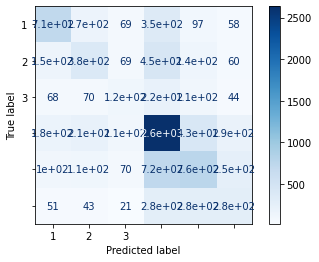

Classifier = Decision Tree, Score (test, accuracy) = 39.90,
Confusion Matrix


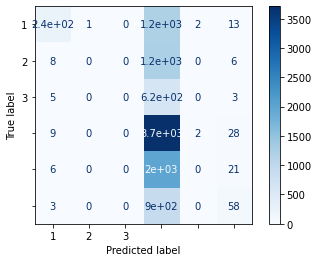

Classifier = Random Forest, Score (test, accuracy) = 37.30,
Confusion Matrix


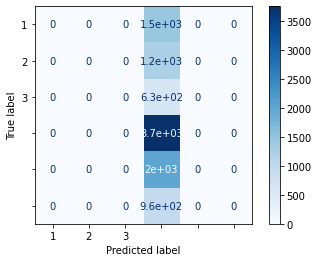

Classifier = Gradient Boosting, Score (test, accuracy) = 47.58,
Confusion Matrix


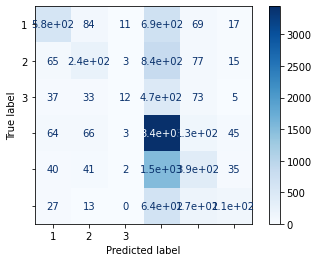

+--------------------+---------------------+--------------------+----------------------+---------------------+
|       Model        |       F1 Score      |      Accuracy      |      Precision       |        Recall       |
+--------------------+---------------------+--------------------+----------------------+---------------------+
| LogisticRegression |  0.4028340049119386 | 48.63681592039801  |  0.4197659120807571  |  0.393245571809315  |
|   Decision Tree    |  0.1568006248469869 | 39.90049751243781  |  0.286799055085003   | 0.20274004127950404 |
|   Random Forest    |  0.0905621180278764 | 37.30348258706468  | 0.062172470978441134 | 0.16666666666666666 |
| Gradient Boosting  | 0.31517559797941214 | 47.582089552238806 |  0.4961227759647127  | 0.30692715961066463 |
+--------------------+---------------------+--------------------+----------------------+---------------------+


In [ ]:
clf_best_sentiment = muller_loop_preprocess_pipeline_toxicity(names,classifiers, features, y)

In [ ]:
#save model
mod = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(n_jobs=1, C=1e5)),
               ])
mod.fit(features, y)  
import pickle
#/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/NLP Project/Sprint4/Bhuvana Gopala Basapur/Bhuvana NLP/data
filename = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/NLP Project/Sprint4/Bhuvana Gopala Basapur/Bhuvana NLP/data/sentiment_model.sav'
pickle.dump(mod, open(filename, 'wb'))

## **Factor-Score**

In [ ]:
df1 = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/NLP Project/Sprint4/Bhuvana Gopala Basapur/Bhuvana NLP/data/factor2.csv', index_col=0)

In [ ]:
df1

,text,class,question,exclamation,starts_with_num,headline_words,tokenize_text,word_count,sentiment_score,factor_score
0,should i get bings,1,1,0,0,4,"['get', 'bings']",2,0.0000,4.527850
1,which tv female friend group do you belong in,1,1,0,0,9,"['tv', 'female', 'friend', 'group', 'belong']",5,0.4939,11.071298
2,the new star wars the force awakens trailer is...,1,0,0,0,14,"['new', 'star', 'wars', 'force', 'awakens', 't...",8,-0.5574,16.314184
3,this vine of new york on celebrity big brother...,1,0,0,0,12,"['vine', 'new', 'york', 'celebrity', 'big', 'b...",8,0.6115,16.323106
4,a couple did a stunning photo shoot with their...,1,0,0,0,18,"['couple', 'stunning', 'photo', 'shoot', 'baby...",9,-0.3400,22.815298
...,...,...,...,...,...,...,...,...,...,...
11111,this is a huge victory for trump and his suppo...,1,0,1,0,10,"['huge', 'victory', 'trump', 'supporters']",4,0.6369,12.307814
11112,absolutely ridiculous,1,0,1,0,2,"['absolutely', 'ridiculous']",2,-0.4201,5.033929
11115,trump has had enough of jim acostas lies hes n...,1,0,0,0,15,"['trump', 'enough', 'jim', 'acostas', 'lies', ...",9,-0.0062,18.318025
11116,president trump calls on justice sonia sotomay...,1,0,1,0,22,"['president', 'trump', 'calls', 'justice', 'so...",15,0.7506,40.571716


In [ ]:
df1.factor_score.describe()

count    50201.000000
mean        14.350805
std          5.285268
min          0.463731
25%         10.814159
50%         13.557213
75%         16.825498
max         70.102720
Name: factor_score, dtype: float64

In [ ]:
 def getFactorScore(df): 
  for i,row in df.iterrows():
    if row['factor_score'] >= 0 and row['factor_score'] < 8:
      df.loc[i,'factor_score_group'] = 1
    elif row['factor_score'] >= 8 and row['factor_score'] < 13:
        df.loc[i,'factor_score_group'] = 2
    elif row['factor_score'] >= 13 and row['factor_score'] < 16:
        df.loc[i,'factor_score_group'] = 3
    elif row['factor_score'] >= 16 and row['factor_score'] < 25:
        df.loc[i,'factor_score_group'] = 4
    elif row['factor_score'] >= 25 and row['factor_score'] < 50:
        df.loc[i,'factor_score_group'] = 5
    elif row['factor_score'] >= 50 and row['factor_score'] <= 71:
        df.loc[i,'factor_score_group'] = 6

In [ ]:
getFactorScore(df1)

In [ ]:
df1 = df1.dropna()

In [ ]:
df1.head(5)

,text,class,question,exclamation,starts_with_num,headline_words,tokenize_text,word_count,sentiment_score,factor_score,factor_score_group
0,should i get bings,1,1,0,0,4,"['get', 'bings']",2,0.0000,4.527850,3.0
1,which tv female friend group do you belong in,1,1,0,0,9,"['tv', 'female', 'friend', 'group', 'belong']",5,0.4939,11.071298,3.0
2,the new star wars the force awakens trailer is...,1,0,0,0,14,"['new', 'star', 'wars', 'force', 'awakens', 't...",8,-0.5574,16.314184,4.0
3,this vine of new york on celebrity big brother...,1,0,0,0,12,"['vine', 'new', 'york', 'celebrity', 'big', 'b...",8,0.6115,16.323106,4.0
4,a couple did a stunning photo shoot with their...,1,0,0,0,18,"['couple', 'stunning', 'photo', 'shoot', 'baby...",9,-0.3400,22.815298,5.0


Modeling

In [ ]:
features = df1['text']
y = df1['factor_score_group']
#X_train, X_test, y_train, y_test = train_test_split(features, y, random_state=20)

Classifier = LogisticRegression, Score (test, accuracy) = 43.51,
Confusion Matrix


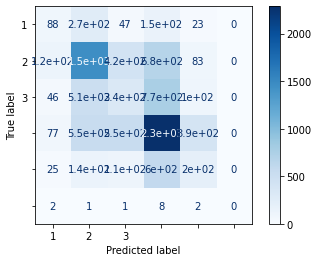

Classifier = Decision Tree, Score (test, accuracy) = 43.09,
Confusion Matrix


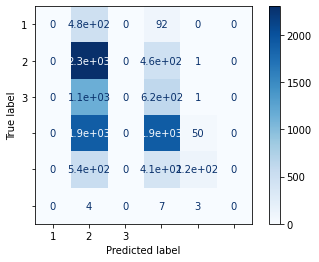

Classifier = Random Forest, Score (test, accuracy) = 38.42,
Confusion Matrix


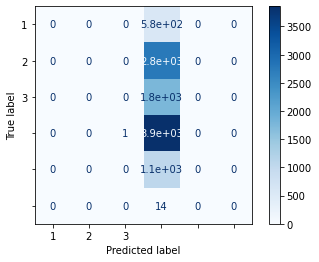

Classifier = Gradient Boosting, Score (test, accuracy) = 51.06,
Confusion Matrix


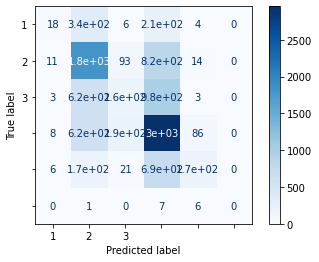

+--------------------+---------------------+--------------------+---------------------+---------------------+
|       Model        |       F1 Score      |      Accuracy      |      Precision      |        Recall       |
+--------------------+---------------------+--------------------+---------------------+---------------------+
| LogisticRegression |  0.2783316929823811 | 43.505976095617534 |  0.2882710939550318 |  0.2750666656071376 |
|   Decision Tree    | 0.20153477628486707 | 43.08764940239044  |  0.2638355622203607 | 0.23917417949722555 |
|   Random Forest    | 0.09251397184044517 | 38.41633466135458  | 0.06403360228442408 |  0.1666234663901849 |
| Gradient Boosting  | 0.27512047871722567 | 51.05577689243028  | 0.39433373258893406 |  0.2846610769300313 |
+--------------------+---------------------+--------------------+---------------------+---------------------+


In [ ]:
clf_best_factorscore = muller_loop_preprocess_pipeline_toxicity(names,classifiers, features, y)

In [ ]:
mod = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', GradientBoostingClassifier(n_estimators=50, learning_rate=1.0, max_depth=1, random_state=0)),
               ])
mod.fit(features, y)  
import pickle
#/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/NLP Project/Sprint4/Bhuvana Gopala Basapur/Bhuvana NLP/data
filename = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/NLP Project/Sprint4/Bhuvana Gopala Basapur/Bhuvana NLP/data/factorscore_model.sav'
pickle.dump(mod, open(filename, 'wb'))

In [ ]:
df3 = df1.iloc[:,[0,10]]

In [ ]:
df3

,text,factor_score_group
0,should i get bings,3.0
1,which tv female friend group do you belong in,3.0
2,the new star wars the force awakens trailer is...,4.0
3,this vine of new york on celebrity big brother...,4.0
4,a couple did a stunning photo shoot with their...,5.0
...,...,...
11111,this is a huge victory for trump and his suppo...,2.0
11112,absolutely ridiculous,1.0
11115,trump has had enough of jim acostas lies hes n...,4.0
11116,president trump calls on justice sonia sotomay...,5.0


## Flesch-Kincaid score

In [ ]:
df2 = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/NLP Project/Sprint4/Bhuvana Gopala Basapur/Bhuvana NLP/data/factor3.csv', index_col=0)

In [ ]:
df2['fs_score'].describe()

count    50201.000000
mean         7.062752
std          4.494923
min        -15.700000
25%          3.700000
50%          6.800000
75%         10.000000
max         55.600000
Name: fs_score, dtype: float64

In [ ]:
 def getFleschKincaidScore(df): 
  for i,row in df.iterrows():
    if row['fs_score'] >= -15 and row['fs_score'] < -8:
      df.loc[i,'fs_score_group'] = 1
    elif row['fs_score'] >= -8 and row['fs_score'] < -1:
        df.loc[i,'fs_score_group'] = 2
    elif row['fs_score'] >= -1 and row['fs_score'] < 3:
        df.loc[i,'fs_score_group'] = 3
    elif row['fs_score'] >= 3 and row['fs_score'] < 6:
        df.loc[i,'fs_score_group'] = 4
    elif row['fs_score'] >= 6 and row['fs_score'] < 10:
        df.loc[i,'fs_score_group'] = 5
    elif row['fs_score'] >= 10 and row['fs_score'] <= 56:
        df.loc[i,'fs_score_group'] = 6

In [ ]:
getFleschKincaidScore(df2)

In [ ]:
df2 = df2.dropna()

In [ ]:
df2.head(5)

,text,class,question,exclamation,starts_with_num,headline_words,tokenize_text,word_count,sentiment_score,factor_score,fs_score,fs_score_group
0,should i get bings,1,1,0,0,4,"['get', 'bings']",2,0.0000,4.527850,-3.1,5.0
1,which tv female friend group do you belong in,1,1,0,0,9,"['tv', 'female', 'friend', 'group', 'belong']",5,0.4939,11.071298,2.9,5.0
2,the new star wars the force awakens trailer is...,1,0,0,0,14,"['new', 'star', 'wars', 'force', 'awakens', 't...",8,-0.5574,16.314184,2.9,4.0
3,this vine of new york on celebrity big brother...,1,0,0,0,12,"['vine', 'new', 'york', 'celebrity', 'big', 'b...",8,0.6115,16.323106,5.2,4.0
4,a couple did a stunning photo shoot with their...,1,0,0,0,18,"['couple', 'stunning', 'photo', 'shoot', 'baby...",9,-0.3400,22.815298,12.7,6.0


Modeling

In [ ]:
features = df2['text']
y = df2['fs_score_group']
#X_train, X_test, y_train, y_test = train_test_split(features, y, random_state=20)

Classifier = LogisticRegression, Score (test, accuracy) = 39.52,
Confusion Matrix


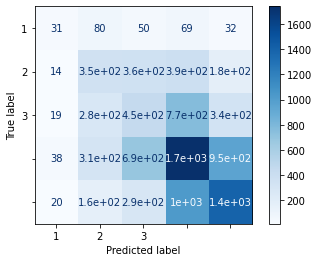

Classifier = Decision Tree, Score (test, accuracy) = 37.63,
Confusion Matrix


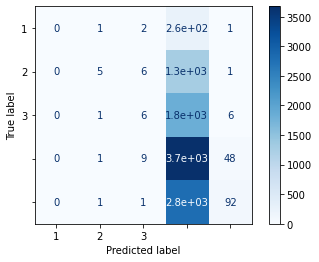

Classifier = Random Forest, Score (test, accuracy) = 37.17,
Confusion Matrix


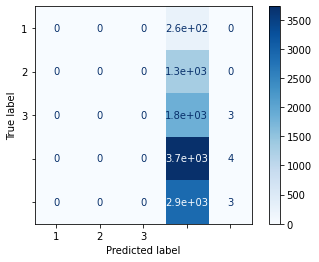

Classifier = Gradient Boosting, Score (test, accuracy) = 39.07,
Confusion Matrix


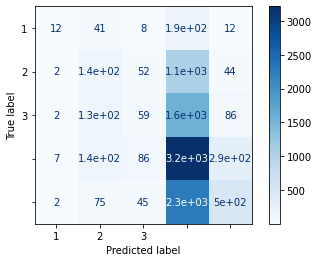

+--------------------+---------------------+-------------------+---------------------+---------------------+
|       Model        |       F1 Score      |      Accuracy     |      Precision      |        Recall       |
+--------------------+---------------------+-------------------+---------------------+---------------------+
| LogisticRegression |  0.3240952722292212 | 39.52191235059761 |  0.342460266693682  | 0.31606278857563624 |
|   Decision Tree    |  0.1230410957567819 | 37.62948207171315 |  0.359986606953845  | 0.20465912106764222 |
|   Random Forest    | 0.10879004685891276 | 37.17131474103586 | 0.13435692921236292 |  0.1999926630713252 |
| Gradient Boosting  |  0.2176006849435237 | 39.07370517928287 | 0.38165338339953286 | 0.24373968206356184 |
+--------------------+---------------------+-------------------+---------------------+---------------------+


In [ ]:
clf_best_factorscore = muller_loop_preprocess_pipeline_toxicity(names,classifiers, features, y)

In [ ]:
mod = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(n_jobs=1, C=1e5)),
               ])
mod.fit(features, y)  
import pickle
#/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/NLP Project/Sprint4/Bhuvana Gopala Basapur/Bhuvana NLP/data
filename = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/NLP Project/Sprint4/Bhuvana Gopala Basapur/Bhuvana NLP/data/fleschKincaidscore_model.sav'
pickle.dump(mod, open(filename, 'wb'))

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50200 entries, 0 to 11117
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   text             50200 non-null  object 
 1   class            50200 non-null  int64  
 2   question         50200 non-null  int64  
 3   exclamation      50200 non-null  int64  
 4   starts_with_num  50200 non-null  int64  
 5   headline_words   50200 non-null  int64  
 6   tokenize_text    50200 non-null  object 
 7   word_count       50200 non-null  int64  
 8   sentiment_score  50200 non-null  float64
 9   factor_score     50200 non-null  float64
 10  fs_score         50200 non-null  float64
 11  fs_score_group   50200 non-null  float64
dtypes: float64(4), int64(6), object(2)
memory usage: 5.0+ MB


In [ ]:
df4 = df2.iloc[:,[0,11]]

## **Amalgamation**


In [ ]:
#final_df = pd.DataFrame()
# final_df['text'] = df['text']
# final_df['word_count'] = df['word_count']
# final_df['sentiment_score'] = df['sentiment_group']
# final_df['format_score'] = df1['factor_score_group']
# final_df['Flesch_kincaid_score'] = df2['fs_score_group']
# final_df['clickbait'] = df['class']
dfs = [df, df3, df4]
nan_value =0

In [ ]:
from functools import reduce
df_final = reduce(lambda left,right: pd.merge(left,right,on='text'), dfs)
# final_df = reduce(lambda df_left,df_right: pd.merge(df_left, df_right, 
#                                               left_index=True, right_index=True, 
#                                               how='outer'), 
#                   dfs).fillna(nan_value)

In [ ]:
df_final.head(5)

,text,class,question,exclamation,starts_with_num,tokenize_text,word_count,sentiment_score,sentiment_group,factor_score_group,fs_score_group
0,should i get bings,1,1,0,0,"[get, bings]",2,0.0000,2.0,3.0,5.0
1,which tv female friend group do you belong in,1,1,0,0,"[tv, female, friend, group, belong]",5,0.4939,4.0,3.0,5.0
2,the new star wars the force awakens trailer is...,1,0,0,0,"[new, star, wars, force, awakens, trailer, giv...",8,-0.5574,6.0,4.0,4.0
3,this vine of new york on celebrity big brother...,1,0,0,0,"[vine, new, york, celebrity, big, brother, fuc...",8,0.6115,5.0,4.0,4.0
4,a couple did a stunning photo shoot with their...,1,0,0,0,"[couple, stunning, photo, shoot, baby, learnin...",9,-0.3400,4.0,5.0,6.0


In [ ]:
df_final = df_final.dropna()

In [ ]:
#drop unnecessary columns
df_final = df_final.drop(labels=['question','word_count', 'exclamation','starts_with_num','tokenize_text','sentiment_score'], axis=1)

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69718 entries, 0 to 69717
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   text                69718 non-null  object 
 1   class               69718 non-null  int64  
 2   sentiment_group     69718 non-null  float64
 3   factor_score_group  69718 non-null  float64
 4   fs_score_group      69718 non-null  float64
dtypes: float64(3), int64(1), object(1)
memory usage: 3.2+ MB


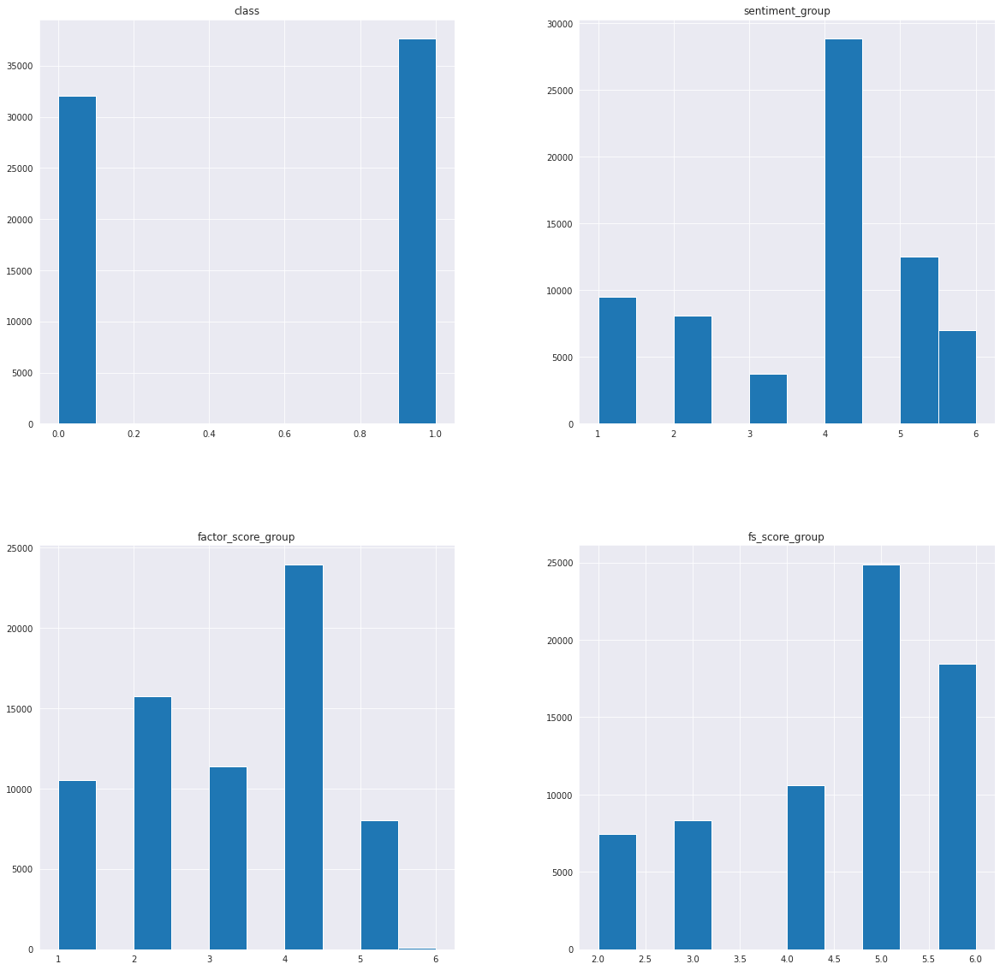

In [ ]:
df_final.hist(figsize=(20,20))
plt.show()

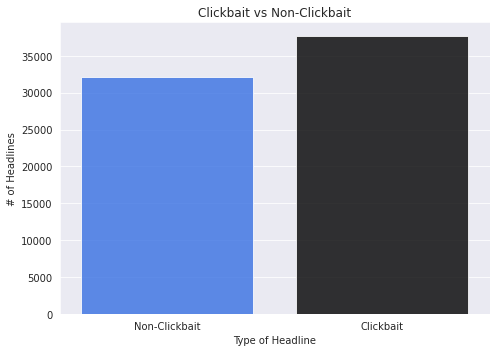

In [ ]:
#class variable countplot
#visualizing class frequency of dataset
sns.set_style('darkgrid')
plt.figure(figsize=(7,5))
fig1=sns.countplot(df_final['class'], alpha =.80, palette= ['#1a66ff','black'])
plt.title('Clickbait vs Non-Clickbait')
plt.ylabel('# of Headlines')
plt.xlabel('Type of Headline')
fig1.set(xticklabels=['Non-Clickbait','Clickbait'])
plt.tight_layout()
plt.savefig('class_dist')
plt.show()

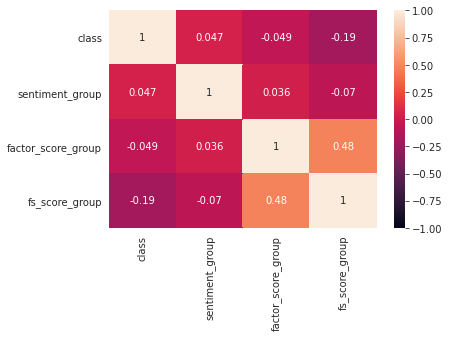

In [ ]:
sns.heatmap(df_final.corr(), vmin=-1, vmax=1, annot=True)


It can be observed that the class has max correlation with sentiment group followed by Factor score and finally with Flesch-Kincaid score.



## Final score to Predict
The final score will be evaluated as:

 y = 0.6(Sentiment score) + 0.22(Factor score) + 0.18(Flesch-Kincaid score)

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69718 entries, 0 to 69717
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   text                69718 non-null  object 
 1   class               69718 non-null  int64  
 2   sentiment_group     69718 non-null  float64
 3   factor_score_group  69718 non-null  float64
 4   fs_score_group      69718 non-null  float64
dtypes: float64(3), int64(1), object(1)
memory usage: 5.7+ MB


In [ ]:

df_final['Score'] = (0.6 * df_final['sentiment_group'] + 0.22 * df_final['factor_score_group'] + 0.18 * df_final['fs_score_group']).astype(int)


In [ ]:
df_final

,text,class,sentiment_group,factor_score_group,fs_score_group,Score
0,should i get bings,1,2.0,3.0,5.0,2
1,which tv female friend group do you belong in,1,4.0,3.0,5.0,3
2,the new star wars the force awakens trailer is...,1,6.0,4.0,4.0,5
3,this vine of new york on celebrity big brother...,1,5.0,4.0,4.0,4
4,a couple did a stunning photo shoot with their...,1,4.0,5.0,6.0,4
...,...,...,...,...,...,...
69713,hillary clinton just cant get over losing to t...,1,5.0,5.0,3.0,4
69714,this is a huge victory for trump and his suppo...,1,6.0,2.0,5.0,4
69715,absolutely ridiculous,1,2.0,1.0,6.0,2
69716,trump has had enough of jim acostas lies hes n...,1,3.0,4.0,4.0,3


In [ ]:
df_final['Score'].unique()

array([2, 3, 5, 4, 1, 6])

# **Inference**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',100)
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import re
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.stem import PorterStemmer
!pip install vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

from pandas_profiling import ProfileReport
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

from sklearn.metrics import confusion_matrix
from sklearn.naive_bayes import MultinomialNB
from nltk.probability import FreqDist
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import KFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

from wordcloud import WordCloud, STOPWORDS

import string
from string import punctuation
from matplotlib import style

!pip install textstat
import textstat as ts

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
     |████████████████████████████████| 133kB 30.1MB/s 
     |████████████████████████████████| 102kB 8.2MB/s 
     |████████████████████████████████| 1.9MB 15.0MB/s 


## Scrape real-time data from Foxnews

Scrape from foxnews

In [ ]:
!pip install feedparser
import feedparser as fp
import pickle

     |████████████████████████████████| 81kB 3.6MB/s 
  Created wheel for sgmllib3k: filename=sgmllib3k-1.0.0-cp37-none-any.whl size=6067 sha256=8e604dfffbfba7f12b7cad20ba4f010c24327dbbc8f704a35ab21fe46e5e7624
  Stored in directory: /root/.cache/pip/wheels/f1/80/5a/444ba08a550cdd241bd9baf8bae44be750efe370adb944506a
Successfully built sgmllib3k


In [ ]:
genre = 'national' #@param ["national", "entertainment", "world","politics","views"]

In [ ]:
def sentence_cleaning(df):
    from sklearn.feature_extraction.text import CountVectorizer
    from nltk.stem import WordNetLemmatizer
    
    import nltk
    nltk.download('stopwords')
    nltk.download('wordnet')
    from nltk.corpus import stopwords
    import re
    lemmatizer = WordNetLemmatizer()
    corpus = []
    
    for i in range(0, len(df)):
        review = re.sub('[^a-zA-Z0-9]', ' ', df['text'][i])
        review = review.lower()
        review = review.split()

        review = [lemmatizer.lemmatize(word) for word in review if not word in stopwords.words('english')]
        review = ' '.join(review)
        corpus.append(review)

    return corpus

In [ ]:
def get_sentence_stru(df):
    import spacy
    from spacy import displacy
    # load Spacy model
    nlp = spacy.load("en_core_web_sm")
    token_list = []
    for doc in df['text']:   
        token_list.append(nlp(doc))

    tags = []
    tag_list = []

    for token in token_list:
        for i in token: 
            tags.append(i.pos_)
        tag_list.append(tags)
        tags = []

    df['sentence_struc'] = tag_list
    df['sentence_struc'] = df['sentence_struc'].astype(str).str.replace(r"\[|\]|'", '')
    
    X = df['sentence_struc'].values
    
    from sklearn.feature_extraction.text import CountVectorizer
    cv = CountVectorizer(max_features = 10)
    X = cv.fit_transform(X).toarray()
    
    return X

In [ ]:
def get_Score(df): 
    df['Score'] = (0.6 * df['clickbait_score'] + 0.33 * df['reliable_source_score'] + 0.07 * df['source_reputation']).astype(int)


In [ ]:
#@title "Get Feed and prediction"

def getfeed(genre):
  if genre == 'national':
    feeds = ["http://feeds.foxnews.com/foxnews/national"]
  elif genre == 'world':
    feeds = ["http://feeds.foxnews.com/foxnews/world"]
  elif genre == 'politics':
    feeds = ["http://feeds.foxnews.com/foxnews/politics"]
  elif genre == 'entertainment':
    feeds = ["http://feeds.foxnews.com/foxnews/entertainment"]
  elif genre == 'views':
    feeds = ["http://feeds.foxnews.com/foxnews/views"]
  else:
    print('Invalid genre')
    return None

  entries = []
  for feed in feeds:
    for e in fp.parse(feed).entries:
        title = e["title"] if e.has_key("title") else None
        #date = e["published"][5:16] if e.has_key("published") else None
        entries.append((title))

  return entries

def getvalue(df):
    # ClickBait
    fleschkincaid_filename = '/content/drive/MyDrive/Underdog/fleschKincaidscore_model.sav'
    factorscore_filename = '/content/drive/MyDrive/Underdog/factorscore_model.sav'
    sentiment_filename = '/content/drive/MyDrive/Underdog/sentiment_model.sav' 
    sentiment_score_model =  pickle.load(open(sentiment_filename, 'rb'))
    factorscore_model = pickle.load(open(factorscore_filename, 'rb'))
    fleschkincaid_model = pickle.load(open(fleschkincaid_filename, 'rb'))
    
    df['flesch_kincaid_score'] = fleschkincaid_model.predict(df['text'])
    df['factor_score'] = factorscore_model.predict(df['text'])
    df['sentiment_score'] = sentiment_score_model.predict(df['text'])
    
    # Reliable source
    reliable_f1 = '/content/drive/MyDrive/Underdog/reliabilty_model.sav'
    reliable_f2 = '/content/drive/MyDrive/Underdog/factor2_model.sav'
    reliable_f3 = '/content/drive/MyDrive/Underdog/factor3_model'
    reliable_model1 = pickle.load(open(reliable_f1, 'rb'))
    reliable_model2 = pickle.load(open(reliable_f2, 'rb'))
    reliable_model3 = pickle.load(open(reliable_f3, 'rb'))
    corpus = sentence_cleaning(df)
    df['truthfulness_score'] = reliable_model2.predict(corpus)
    X = df[['truthfulness_score']]
    df['score_of_reliabilty'] = reliable_model1.predict(X)
    df['fake_or_real'] = reliable_model3.predict(get_sentence_stru(df))
    
    # Reputation Source
    reputation_final = '/content/drive/MyDrive/Underdog/reputation_model.sav'
    reputation_model = pickle.load(open(reputatation_final, 'rb'))
    from sklearn.feature_extraction.text import TfidfVectorizer
    tfidf_v = TfidfVectorizer(max_features=100, ngram_range=(1,3))
    X2 = tfidf_v.fit_transform(corpus).toarray()
    df['source_reputation'] = reputatation_model.predict(X2)

    df['clickbait_score'] = (0.6 * df['sentiment_score'] + 0.22 * df['factor_score'] + 0.18 * df['flesch_kincaid_score']).astype(int)
    df['reliable_source_score'] = (0.7 * df['truthfulness_score'] + 0.25 * df['score_of_reliabilty'] + 0.05 * df['fake_or_real']).astype(int)
    get_Score(df)
    return df[['text', 'clickbait_score', 'reliable_source_score', 'source_reputation', 'Score']]

fn_df = pd.DataFrame(getfeed(genre), columns=["text"])
#fn_df.head(5)
getvalue(fn_df)
#fn_df['ClickBait_Prediction'] = getvalue(fn_df)
# fn_df = fn_df[['text', 'ClickBait_Prediction']]
# fn_df

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,text,clickbait_score,reliable_source_score,source_reputation,Score
0,"Florida 'designated driver' hits parked cars, ...",3,0,1,1
1,"One killed, three wounded in Los Angeles shoot...",2,1,1,1
2,Man killed in shooting at Orlando U.S. immigra...,2,0,1,1
3,"LAPD station firebomb attack caught on camera,...",2,1,1,1
4,Suzanne Morphew’s brother speaks on his suspic...,2,1,1,1
5,Massachusetts cops kill man who repeatedly ram...,2,1,1,1
6,"Body of missing Florida girl, 13, found; teen ...",2,0,0,1
7,Rio Grande border crossing: Live video shows m...,4,1,1,2
8,Second Oregon police officer indicted over BLM...,4,1,1,2
9,Confederate Memorial Day: South Carolina close...,4,3,0,3


In [ ]:
#fn_df.describe()